In [1]:
from pathlib import Path
from copy import deepcopy

import numpy as np

import matplotlib as mp
import matplotlib.pyplot as plt
import seaborn as sns 
import scanpy as sc
import squidpy as sq
import pandas as pd
import anndata as ad
import scipy as sp
from scipy.spatial import distance_matrix
#import commot as ct
from scipy.stats import ttest_ind
from scipy.sparse import csr_array, tril

sc.logging.print_header()

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.23.2 scipy==1.13.1 pandas==2.2.3 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


### Pre-processing

In [2]:
nanostring_dir = Path('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/').resolve()
sample_dir = nanostring_dir

In [5]:
adata = sq.read.nanostring(
    path=sample_dir,
    counts_file="R5941_ColonTMA_exprMat_file_K.csv",
    meta_file="R5941_ColonTMA_metadata_file_K.csv",
    fov_file="R5941_ColonTMA_fov_positions_file_K.csv",
)

In [6]:
# Obtain the control probes using their names prefixed with “NegPrb-“.

adata.var["NegPrb"] = adata.var_names.str.startswith("NegPrb")
sc.pp.calculate_qc_metrics(adata, qc_vars=["NegPrb"], inplace=True)

In [7]:
adata.obs["total_counts_NegPrb"].sum() / adata.obs["total_counts"].sum() * 100

#The percentage of unassigned “NegPrb” transcripts can be calculated from the calculated qc metrics. This can later be used to estimate 
# false discovery rate.

0.14192144649736035

In [8]:
t = ['NegPrb01',
'NegPrb02',
'NegPrb03',
'NegPrb04',
'NegPrb05',
'NegPrb06',
'NegPrb07',
'NegPrb08',
'NegPrb09',
'NegPrb10']

In [9]:
adata = adata[:,~adata.var.index.isin(t)]

In [9]:
exp = pd.DataFrame(adata.X.toarray(),index = adata.obs.index.values, columns = adata.var.index.values)
gene_cell = pd.DataFrame(index = exp.columns, columns = ['count'])

for g in exp.columns:
    gene_cell.loc[g] = len(exp.loc[:,g][exp.loc[:,g]!=0])

In [10]:
np.min(gene_cell.loc[:,'count'])

332

/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_5208/1594851855.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby("fov").sum()["total_counts"],


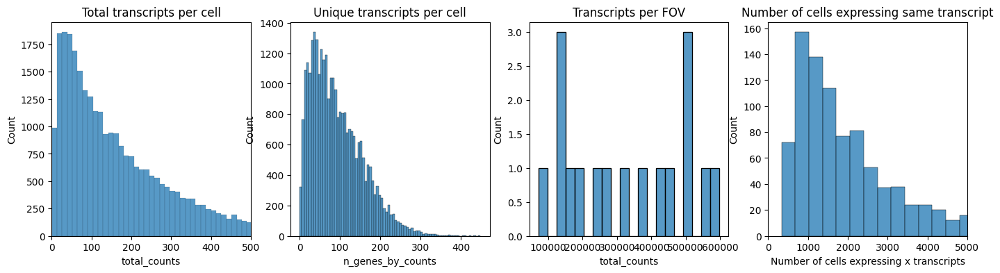

In [11]:
fig, axs = plt.subplots(1, 4, figsize=(17, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
axs[0].set_xlim(0, 500)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Transcripts per FOV")
sns.histplot(
    adata.obs.groupby("fov").sum()["total_counts"],
    kde=False,
    bins =20,
    ax=axs[2],
)

axs[3].set_title("Number of cells expressing same transcript")
sns.histplot(
    gene_cell['count'],
    kde=False,
    bins =60,
    ax=axs[3]
)
axs[3].set(xlabel='Number of cells expressing x transcripts')
axs[3].set_xlim(0, 5000)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/quality.pdf',bbox_inches="tight")

In [10]:
# Filter the cells based on the minimum number of counts required using scanpy.pp.filter_cells. Filter the genes based on the minimum 
# number of cells required with scanpy.pp.filter_genes. The parameters for both were specified based on the plots above. This filtering 
# is quite conservative, more relaxed settings might also be applicable. Other criteria for filtering cells could be area, 
# immunofluorescence signal or number of unique transcripts.

sc.pp.filter_cells(adata, min_counts=25)
#sc.pp.filter_genes(adata, min_cells=700)

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:164: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


In [11]:
# Normalize counts per cell 
sc.pp.normalize_total(adata, inplace = True)

sc.pp.log1p(adata)

# PCA
sc.pp.pca(adata, random_state=10)

# compute a beigthorhood graph
sc.pp.neighbors(adata, random_state=10)

# embed the neighborhood graph of the data
sc.tl.umap(adata, random_state=10)

# cluster the cells into subgroups 
sc.tl.leiden(adata, resolution=1.2, random_state=10)

/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_2817/1192101804.py:16: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.2, random_state=10)


In [11]:
num_cells_per_patient = {}

for p in pd.unique(adata.obs.Patients):
    num_cells_per_patient[p] = adata[adata.obs.Patients == p].shape[0]

In [15]:
num_cells_per_patient

{'Patient_1': 577,
 'Patient_2': 3291,
 'Patient_4': 3877,
 'Patient_6': 6311,
 'Patient_7': 1257,
 'Patient_8': 6108,
 'Patient_9': 5336}

In [12]:
num_cells_per_fov = {}

for f in pd.unique(adata.obs.fov):
    num_cells_per_fov[f] = adata[adata.obs.fov == f].shape[0]

In [13]:
num_cells_per_fov

{'1': 577,
 '4': 1275,
 '5': 2016,
 '6': 1597,
 '7': 1172,
 '8': 1108,
 '9': 2473,
 '10': 1918,
 '11': 1920,
 '12': 825,
 '13': 432,
 '14': 2194,
 '16': 1753,
 '17': 2161,
 '18': 1758,
 '19': 1905,
 '20': 1673}

In [12]:
palette = ['#0F2080', '#006600', '#AA3377', '#BBBBBB', '#AEC7E8', '#CCBB44', '#F7B6D2','#000000',
          '#0077BB', '#EE7733', '#33BBEE', '#CC3311', '#7F7F7F', '#FFB000','#601A4A','#785EF0','#66CC00', '#CCFF99', 
          '#660000', '#E5CCFF','#FFFFCC','#CCFFE5']

sns.color_palette(palette)

[(0.058823529411764705, 0.12549019607843137, 0.5019607843137255),
 (0.0, 0.4, 0.0),
 (0.6666666666666666, 0.2, 0.4666666666666667),
 (0.7333333333333333, 0.7333333333333333, 0.7333333333333333),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (0.8, 0.7333333333333333, 0.26666666666666666),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.0, 0.0, 0.0),
 (0.0, 0.4666666666666667, 0.7333333333333333),
 (0.9333333333333333, 0.4666666666666667, 0.2),
 (0.2, 0.7333333333333333, 0.9333333333333333),
 (0.8, 0.2, 0.06666666666666667),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (1.0, 0.6901960784313725, 0.0),
 (0.3764705882352941, 0.10196078431372549, 0.2901960784313726),
 (0.47058823529411764, 0.3686274509803922, 0.9411764705882353),
 (0.4, 0.8, 0.0),
 (0.8, 1.0, 0.6),
 (0.4, 0.0, 0.0),
 (0.8980392156862745, 0.8, 1.0),
 (1.0, 1.0, 0.8),
 (0.8, 1.0, 0.8980392156862745)]

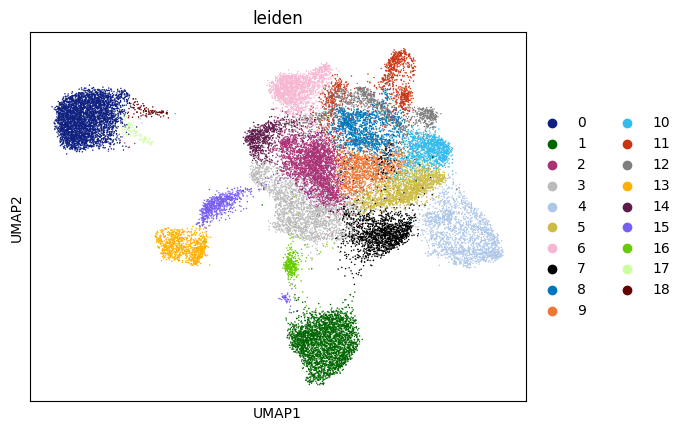

In [13]:
sc.pl.umap(
    adata, show=False,
    color= "leiden", palette=sns.color_palette(palette)
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_clusters_not_named_before_subclustering.pdf',bbox_inches="tight")

In [19]:
cat_name = "leiden"
sig_leiden = pd.DataFrame(
    columns=adata.var_names, index=adata.obs[cat_name].cat.categories
)

# for each cluster, extract the average expression of each gene in the cells of that cluster
for clust in adata.obs[cat_name].cat.categories:
    sig_leiden.loc[clust] = adata[adata.obs[cat_name].isin([clust]), :].X.mean(0)
# transpose this matrix so that the columns are the clusters and the rows are the cosmx genes
sig_leiden = sig_leiden.transpose()

sig_leiden.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/gene_counts_all_clusters_non_named_before_subclustering.xlsx')

In [20]:
num_top_genes = 50

l = list()

for inst_cluster in sig_leiden.columns.tolist():
    # for each leiden cluster (column names of sig_leiden dataframe), sort the genes in decreasing order of expression and keep the 30 genes with 
# highest expression.
    top_genes = (
        sig_leiden[inst_cluster]
        .sort_values(ascending=False)
        .index.tolist()[:num_top_genes]
    )
    l.append(inst_cluster)
    l.append((sig_leiden[inst_cluster][top_genes].to_string()))

with open('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/top_50_genes_clusters_non_named_before_subclustering.txt', 'w') as fp:
    for item in l:
        # write each item on a new line
        fp.write("%s\n" % item)
        fp.write("\n\n")

In [ ]:
# FCGBP (0,13), AGR2 (0,13) -> goblet
# CD24 (1,4), LYZ (4,17), SERPINA1 (4) -> paneth
# COL1A1 (8,12,3,11,7), DCN (12,11,3) -> fibroblast
# INHBA (8,7,3,11), 
# CXCL14 (7,12) -> CAF CXCL14
# PDGFRB (10) -> pericyte
# PECAM1 (2), CD93 (2), TIE1 (2) -> endothelial
# IGKC (6), IGHG1 (7), IGHA1 (7)  -> plasma
# MS4A1 (11), CD19 (11) -> B
# CD68 (15), CD163 (14,9), CD14 (14) -> macrophage
# CD3D (11), CD3E (11), CD3G (11), CD2 (3,9,5), CCL5 (5,3) -> T
# MYH11 (10,7), ACTG2 (10,7) -> smooth
# EPCAM (1,4,16,0,13) -> epithelial
# KIT (0,17), TPSAB1.B2 (11), CPA3 (11) -> mast cells

In [147]:
sig_leiden.loc['CD14',].sort_values(ascending=False)

14    0.468328
3     0.340124
17    0.207969
12    0.099846
2     0.095585
9     0.070249
6     0.062449
16    0.060485
18    0.059438
5     0.053112
4     0.050071
8     0.048272
10    0.040609
7      0.03958
1     0.036582
11    0.035131
15    0.032177
0     0.029749
13    0.018915
Name: CD14, dtype: object

In [14]:
adata_subset = adata[adata.obs.leiden.isin(['2','4','9'])].copy()

# Normalize counts per cell 
sc.pp.normalize_total(adata_subset, inplace = True)

# logarithmize
sc.pp.log1p(adata_subset)

# PCA
sc.pp.pca(adata_subset, random_state=10)

# compute a beigthorhood graph
sc.pp.neighbors(adata_subset, random_state=10)

# embed the neighborhood graph of the data
sc.tl.umap(adata_subset, random_state=10)

# cluster the cells into subgroups 
sc.tl.leiden(adata_subset, resolution=1, random_state=10)

<Axes: title={'center': 'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>

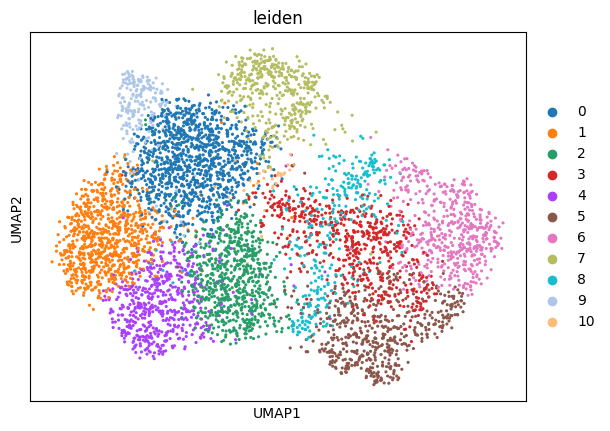

In [15]:
sc.pl.umap(
    adata_subset, show=False,
    color= "leiden"
)

In [23]:
cat_name = "leiden"
sig_leiden2 = pd.DataFrame(
    columns=adata_subset.var_names, index=adata_subset.obs[cat_name].cat.categories
)

# for each cluster, extract the average expression of each gene in the cells of that cluster
for clust in adata_subset.obs[cat_name].cat.categories:
    sig_leiden2.loc[clust] = adata_subset[adata_subset.obs[cat_name].isin([clust]), :].X.mean(0)
# transpose this matrix so that the columns are the clusters and the rows are the cosmx genes
sig_leiden2 = sig_leiden2.transpose()

sig_leiden2.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/gene_counts_all_clusters_non_named_only_2_4_9.xlsx')

In [24]:
num_top_genes = 50

l = list()

for inst_cluster in sig_leiden2.columns.tolist():
    # for each leiden cluster (column names of sig_leiden dataframe), sort the genes in decreasing order of expression and keep the 30 genes with 
# highest expression.
    top_genes = (
        sig_leiden2[inst_cluster]
        .sort_values(ascending=False)
        .index.tolist()[:num_top_genes]
    )
    l.append(inst_cluster)
    l.append((sig_leiden2[inst_cluster][top_genes].to_string()))

with open('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/top_50_genes_clusters_non_named_only_2_4_9.txt', 'w') as fp:
    for item in l:
        # write each item on a new line
        fp.write("%s\n" % item)
        fp.write("\n\n")

In [256]:
sig_leiden2.loc['CD14',].sort_values(ascending=False)

# endo: 4,1,5
# pericyte: 6
# muscle: 3,2,0


9     0.223353
7     0.061879
3     0.055938
0     0.048815
2      0.04434
8     0.039805
1     0.034964
4     0.033241
6     0.027757
5     0.017733
10         0.0
Name: CD14, dtype: object

In [16]:
adata_subset.obs.leiden.cat.rename_categories(['20', '21', '22', '23','24','25', '26','27','28','29','30'])

map_dict = {'0':'20', '1':'21', '2':'22', '3':'23', '4':'24', '5':'25','6':'26','7':'27','8':'28','9':'29','10':'30'}

adata_subset.obs['new_leiden'] = adata_subset.obs['leiden'].map(map_dict).astype('category')
adata_subset.obs.new_leiden

1_1        20
3_1        21
4_1        20
8_1        24
12_1       20
           ..
1662_20    25
1679_20    23
1684_20    24
1697_20    25
1700_20    24
Name: new_leiden, Length: 5854, dtype: category
Categories (11, object): ['20', '21', '22', '23', ..., '27', '28', '29', '30']

In [26]:
adata.obs.leiden.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/old_2_4_9.csv')
adata_subset.obs.new_leiden.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/reclust_2_4_9.csv')

In [17]:
new = pd.read_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/merge_2_4_9.csv', index_col=0)
adata2 = adata.copy()
adata2.obs['new_leiden'] = new
adata2.obs['new_leiden'] = adata2.obs['new_leiden'].astype("category")

In [18]:
palette = ['#0F2080', '#006600', '#AA3377', '#BBBBBB', '#AEC7E8', '#CCBB44', '#F7B6D2','#000000',
          '#0077BB', '#EE7733', '#33BBEE', '#CC3311', '#7F7F7F', '#FFB000','#601A4A','#785EF0','#66CC00', '#CCFF99',
           '#EE6677','#009988','#F0E442', '#FFFF66',"#666600", '#994C00', '#E5CCFF','#FFFFCC','#CCFFE5']

sns.color_palette(palette)

[(0.058823529411764705, 0.12549019607843137, 0.5019607843137255),
 (0.0, 0.4, 0.0),
 (0.6666666666666666, 0.2, 0.4666666666666667),
 (0.7333333333333333, 0.7333333333333333, 0.7333333333333333),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (0.8, 0.7333333333333333, 0.26666666666666666),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.0, 0.0, 0.0),
 (0.0, 0.4666666666666667, 0.7333333333333333),
 (0.9333333333333333, 0.4666666666666667, 0.2),
 (0.2, 0.7333333333333333, 0.9333333333333333),
 (0.8, 0.2, 0.06666666666666667),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (1.0, 0.6901960784313725, 0.0),
 (0.3764705882352941, 0.10196078431372549, 0.2901960784313726),
 (0.47058823529411764, 0.3686274509803922, 0.9411764705882353),
 (0.4, 0.8, 0.0),
 (0.8, 1.0, 0.6),
 (0.9333333333333333, 0.4, 0.4666666666666667),
 (0.0, 0.6, 0.5333333333333333),
 (0.9411764705882353, 0.8941176470588236, 0.25882352941176473),
 (1.0, 1.0, 0.4),
 (0.4, 0.4, 0.0),
 (0.6, 0.2980392156862745, 0.0),
 (0.8980392156862745, 0.8, 1.0),
 (1.0, 1.0, 0.8),
 (0.8, 1.0, 0.8980392156862745)]

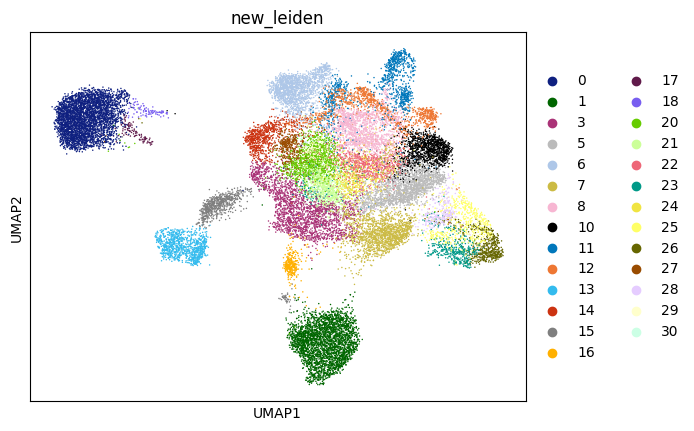

In [19]:
sc.pl.umap(
    adata2, show=False,
    color= "new_leiden", palette=sns.color_palette(palette)
)
plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_clusters_not_named_after_subclustering.pdf',bbox_inches="tight")

In [20]:
map_dict = {0:'Goblet', 1:'Epithelial', 3:'Macrophage', 5:'CAF',6:'Smooth muscle',
           7:'CAF CXCL14',8:'Endothelial',10:'CAF',11:'Pericyte',12:'CAF',13:'Paneth',
           14:'Macrophage',15:'Paneth',16:'Epithelial',17:'Goblet',18:'Goblet',20:'Not annotated',
           21:'T',22:'Fibroblast',23:'B',24:'T',25:'Plasma IgG',26:'Plasma IgG',27:'Monocyte',
           28:'Plasma IgA',29:'Macrophage',30:'Mast cell'}

adata2.obs['leiden'] = adata2.obs['new_leiden'].map(map_dict).astype('category')
adata2.obs.leiden

# endo: 4,1,5
# pericyte: 6
# muscle: 3,2,0

1_1        Not annotated
2_1           Macrophage
3_1                    T
4_1        Not annotated
5_1           Macrophage
               ...      
1695_20       CAF CXCL14
1696_20       CAF CXCL14
1697_20       Plasma IgG
1698_20       Epithelial
1700_20                T
Name: leiden, Length: 26757, dtype: category
Categories (17, object): ['B', 'CAF', 'CAF CXCL14', 'Endothelial', ..., 'Plasma IgA', 'Plasma IgG', 'Smooth muscle', 'T']

In [31]:
cat_name = "new_leiden"
sig_leiden = pd.DataFrame(
    columns=adata2.var_names, index=adata2.obs[cat_name].cat.categories
)

# for each cluster, extract the average expression of each gene in the cells of that cluster
for clust in adata2.obs[cat_name].cat.categories:
    sig_leiden.loc[clust] = adata2[adata2.obs[cat_name].isin([clust]), :].X.mean(0)
# transpose this matrix so that the columns are the clusters and the rows are the cosmx genes
sig_leiden = sig_leiden.transpose()

sig_leiden.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/gene_counts_all_clusters_not_named_after_subsampling.xlsx')

In [32]:
cat_name = "leiden"
sig_leiden = pd.DataFrame(
    columns=adata2.var_names, index=adata2.obs[cat_name].cat.categories
)

# for each cluster, extract the average expression of each gene in the cells of that cluster
for clust in adata2.obs[cat_name].cat.categories:
    sig_leiden.loc[clust] = adata2[adata2.obs[cat_name].isin([clust]), :].X.mean(0)
# transpose this matrix so that the columns are the clusters and the rows are the cosmx genes
sig_leiden = sig_leiden.transpose()

sig_leiden.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/gene_counts_all_clusters_named.xlsx')

In [21]:
palette = ['#FFB000','#0F2080', '#228833', '#AA3377', '#BBBBBB', '#AEC7E8', '#CCBB44', '#F7B6D2',
          '#000000', '#33BBEE', '#CC3311', '#666600','#FFFF66','#CCFF99','#FF33FF','#0077BB','#994C00']

sns.color_palette(palette)

[(1.0, 0.6901960784313725, 0.0),
 (0.058823529411764705, 0.12549019607843137, 0.5019607843137255),
 (0.13333333333333333, 0.5333333333333333, 0.2),
 (0.6666666666666666, 0.2, 0.4666666666666667),
 (0.7333333333333333, 0.7333333333333333, 0.7333333333333333),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (0.8, 0.7333333333333333, 0.26666666666666666),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.0, 0.0, 0.0),
 (0.2, 0.7333333333333333, 0.9333333333333333),
 (0.8, 0.2, 0.06666666666666667),
 (0.4, 0.4, 0.0),
 (1.0, 1.0, 0.4),
 (0.8, 1.0, 0.6),
 (1.0, 0.2, 1.0),
 (0.0, 0.4666666666666667, 0.7333333333333333),
 (0.6, 0.2980392156862745, 0.0)]

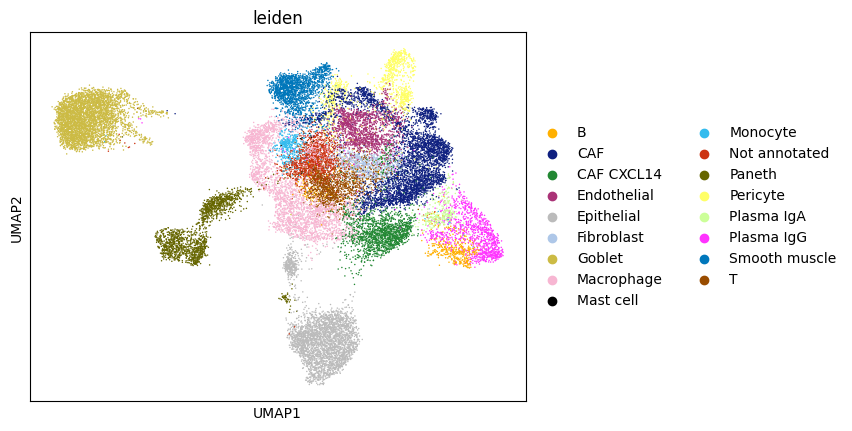

In [22]:
sc.pl.umap(
    adata2, show=False,
    color= "leiden", palette=sns.color_palette(palette)
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_clusters_named.pdf',bbox_inches="tight")

In [23]:
level = []

for p in adata2.obs.Patients:
    if p in ['Patient_1', 'Patient_6','Patient_8',
                    'Patient_9']:
        level.append('LOW')
    else:
        level.append('HIGH')

In [24]:
adata2.obs['level'] = level
adata2.obs['level'] = adata2.obs['level'].astype("category")

In [22]:
disease = []

for p in adata2.obs.Patients:
    if p in ['Patient_2', 'Patient_7', 'Patient_9']:
        disease.append('K_UC')
    else:
        disease.append('K_CD')

In [23]:
adata2.obs['disease'] = disease
adata2.obs['disease'] = adata2.obs['disease'].astype("category")

In [24]:
sig_leiden.loc['ZBTB16',].sort_values(ascending=False)

Pericyte         0.351168
Smooth muscle    0.172495
Fibroblast        0.12196
Endothelial      0.102752
T                 0.05954
B                0.058132
Macrophage       0.040627
CAF              0.035109
Plasma IgA       0.027984
Goblet           0.025203
Epithelial       0.025047
Plasma IgG       0.019067
CAF CXCL14         0.0181
Paneth           0.017649
Name: ZBTB16, dtype: object

In [39]:
T_CAF = []

for c in adata2.obs.leiden:
    if c in ['T','CAF', 'CAF CXCL14']:
        T_CAF.append(c)
    else:
        T_CAF.append('other')

In [40]:
adata2.obs['T_CAF'] = T_CAF
adata2.obs['T_CAF'] = adata2.obs['T_CAF'].astype("category")

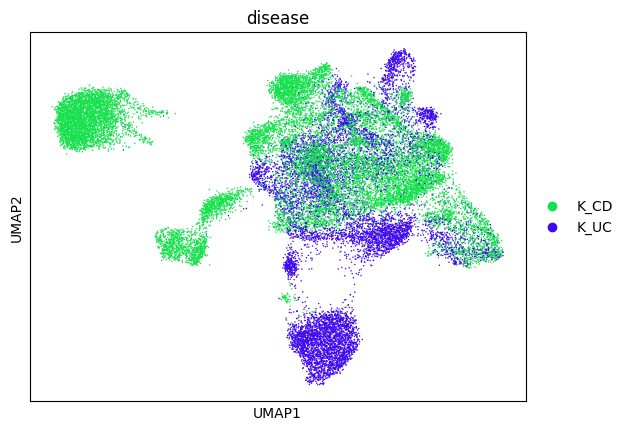

In [39]:
sc.pl.umap(
    adata2, show=False,
    color= "disease", palette=sns.color_palette(['#14E14B','#3F09F0'])
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_disease.pdf',bbox_inches="tight")

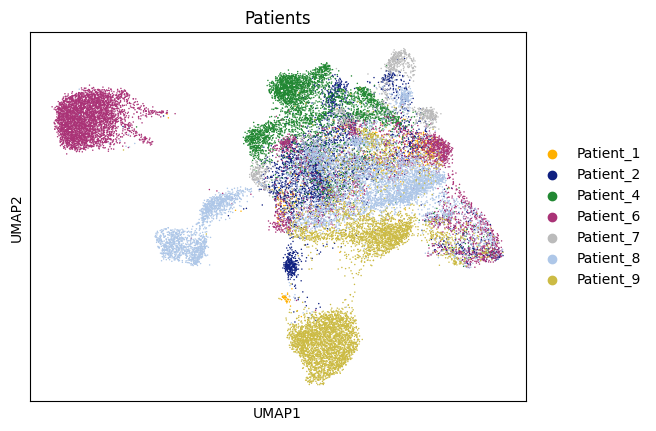

In [40]:
sc.pl.umap(
    adata2, show=False,
    color= "Patients", palette=sns.color_palette(palette)
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_patient.pdf',bbox_inches="tight")

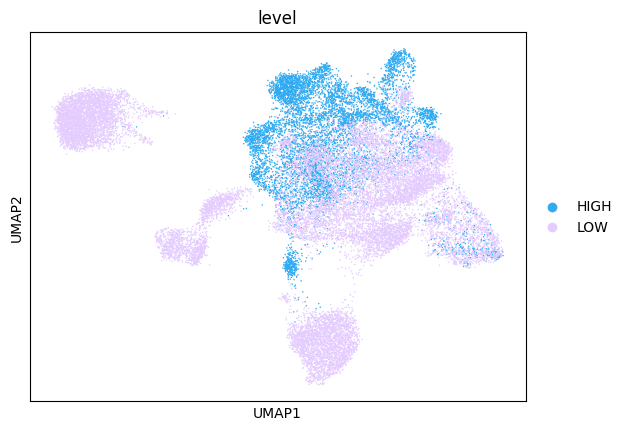

In [41]:
sc.pl.umap(
    adata2, show=False,
    color= "level", palette=sns.color_palette(['#30ABF2','#E5CCFF'])
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_level.pdf',bbox_inches="tight")


In [41]:
adata2.obs.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/metadata_adata.csv')

In [42]:
adata2.var.to_csv("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/gene_names_adata.csv")

In [43]:
fov_names = adata2.obs['fov']
fov_names = adata2.obs['fov']
fov_names = fov_names.astype("string")
patients_names = adata2.obs['Patients']
patients_names = patients_names.astype("string")
level_names = adata2.obs['level']
level_names = level_names.astype("string")

In [81]:
list(set('fov ' + fov_names + ' - ' + patients_names + ' - ' + level_names))

['fov 14 - Patient_8 - LOW',
 'fov 8 - Patient_4 - HIGH',
 'fov 20 - Patient_9 - LOW',
 'fov 16 - Patient_8 - LOW',
 'fov 5 - Patient_2 - HIGH',
 'fov 12 - Patient_7 - HIGH',
 'fov 1 - Patient_1 - LOW',
 'fov 9 - Patient_6 - LOW',
 'fov 10 - Patient_6 - LOW',
 'fov 17 - Patient_8 - LOW',
 'fov 18 - Patient_9 - LOW',
 'fov 4 - Patient_2 - HIGH',
 'fov 19 - Patient_9 - LOW',
 'fov 11 - Patient_6 - LOW',
 'fov 6 - Patient_4 - HIGH',
 'fov 7 - Patient_4 - HIGH',
 'fov 13 - Patient_7 - HIGH']

In [64]:
adata2.uns['spatial'].keys()

dict_keys(['1', '10', '11', '12', '13', '14', '16', '17', '18', '19', '20', '4', '5', '6', '7', '8', '9'])

In [44]:
t = ['fov 1 - Patient_1 - LOW',
     'fov 10 - Patient_6 - LOW',
     'fov 11 - Patient_6 - LOW',
     'fov 12 - Patient_7 - HIGH',
     'fov 13 - Patient_7 - HIGH',
    'fov 14 - Patient_8 - LOW',
     'fov 16 - Patient_8 - LOW',
 'fov 17 - Patient_8 - LOW',
 'fov 18 - Patient_9 - LOW',
     'fov 19 - Patient_9 - LOW',
     'fov 20 - Patient_9 - LOW',
     'fov 4 - Patient_2 - HIGH',
     'fov 5 - Patient_2 - HIGH',
     'fov 6 - Patient_4 - HIGH',
 'fov 7 - Patient_4 - HIGH',
 'fov 8 - Patient_4 - HIGH',
'fov 9 - Patient_6 - LOW']

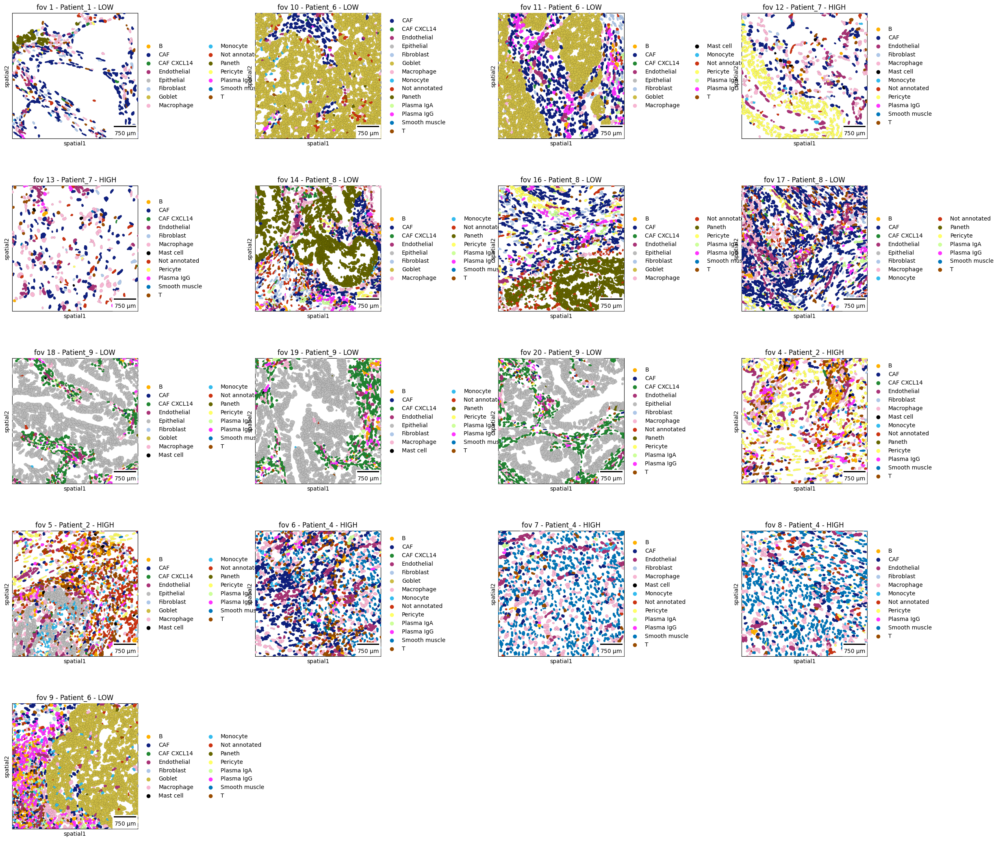

In [45]:
sq.pl.spatial_segment(
    adata2,
    color="leiden",
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True,
    img=False,
    title=t,
    scalebar_dx=1.0,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/fov_patients_level_senza_back.pdf',bbox_inches="tight")

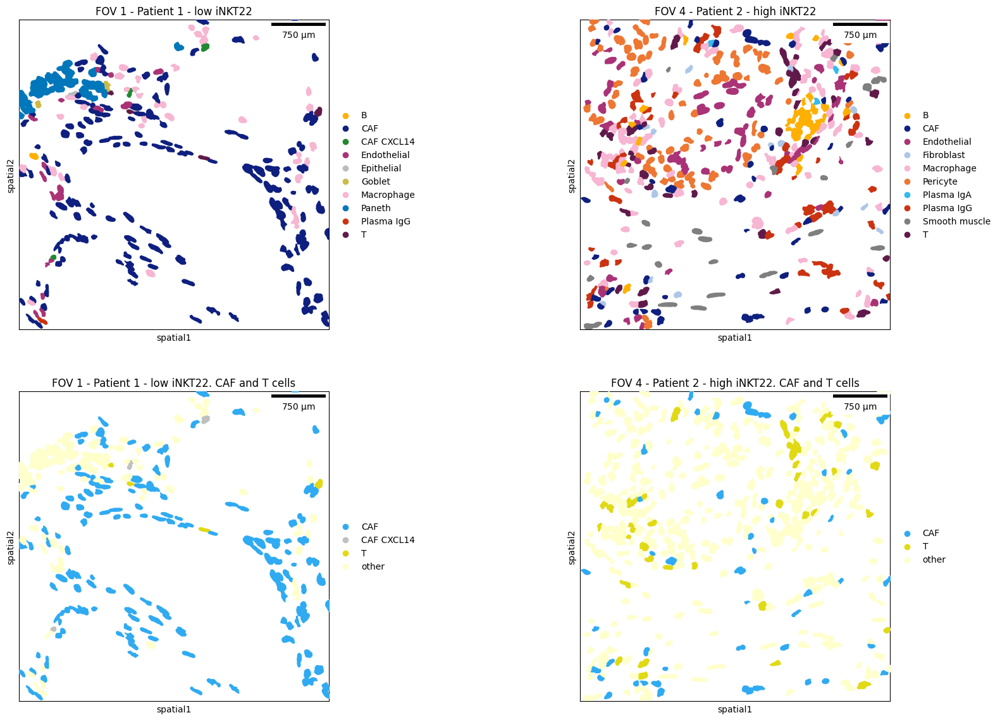

In [43]:
fig, ax = plt.subplots(2, 2, figsize=(21, 14))
sq.pl.spatial_segment(
    adata2,
    shape="hex",
    color="leiden",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    img=False,
    scalebar_dx=1.0,
    size=60,
    ax=ax[0][0], 
    title='FOV 1 - Patient 1 - low iNKT22'
)

sq.pl.spatial_segment(
    adata2,
    color="leiden",
    library_key="fov",
    library_id="4",
    seg_cell_id="cell_ID",
    img=False,
    scalebar_dx=1.0,
    size=60,
    ax=ax[0][1], 
    title='FOV 4 - Patient 2 - high iNKT22'
)

sq.pl.spatial_segment(
    adata2,
    color="T_CAF",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    scalebar_dx=1.0,
    img=False,
    size=60,
    ax=ax[1][0], palette=mp.colors.ListedColormap(['#30ABF2','#C0C0C0','#E1DA14','#FFFFCC']),
    title='FOV 1 - Patient 1 - low iNKT22. CAF and T cells'
)

sq.pl.spatial_segment(
    adata2,
    color="T_CAF",
    library_key="fov",
    library_id="4",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    scalebar_dx=1.0,
    ax=ax[1][1], palette=mp.colors.ListedColormap(['#30ABF2','#C0C0C0','#E1DA14','#FFFFCC']),
    title='FOV 4 - Patient 2 - high iNKT22. CAF and T cells'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/fov_1_low_4_high.pdf',bbox_inches="tight")

# DEGs with scanpy

In [46]:
clusters = ["T","B",'Plasma IgA',"Plasma IgG","Macrophage","Mast cell","Monocyte","Smooth muscle","Pericyte", "Endothelial",
                                     "Epithelial","Paneth", "Goblet","Fibroblast","CAF","CAF CXCL14", 'Not annotated']
adata2.obs["clusters_ordered"] = pd.Categorical(
    values=adata2.obs.leiden, categories=clusters, ordered=True
)

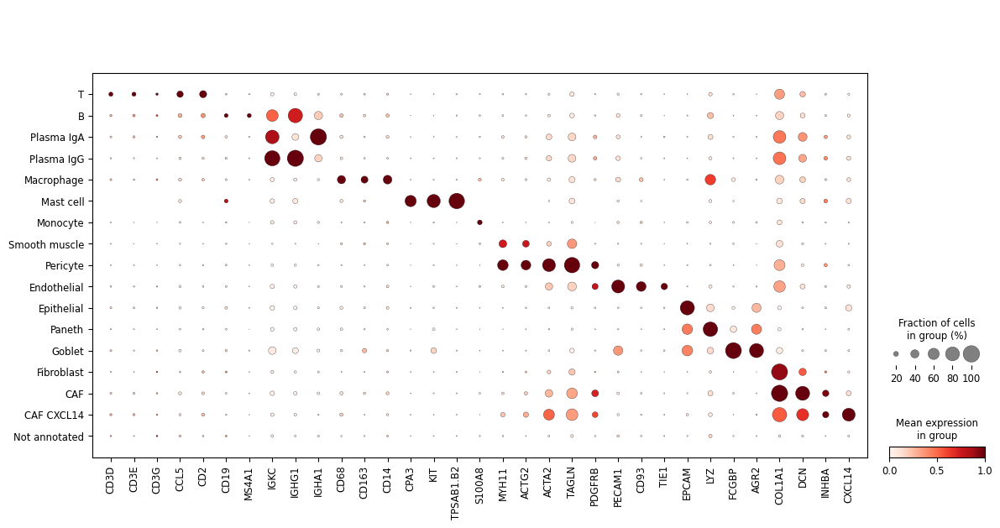

In [47]:
markers = ['CD3D',	'CD3E',	'CD3G', 'CCL5',	'CD2',	'CD19', 'MS4A1',	
             'IGKC', 'IGHG1','IGHA1',
             'CD68', 'CD163', 'CD14','CPA3','KIT','TPSAB1.B2','S100A8','MYH11', 'ACTG2', 'ACTA2', 'TAGLN', 'PDGFRB',
             'PECAM1', 'CD93', 'TIE1','EPCAM', 'LYZ','FCGBP', 'AGR2',
            'COL1A1', 'DCN', 'INHBA', 'CXCL14']

sc.pl.dotplot(adata2, markers, groupby='clusters_ordered', standard_scale="var", save=True)

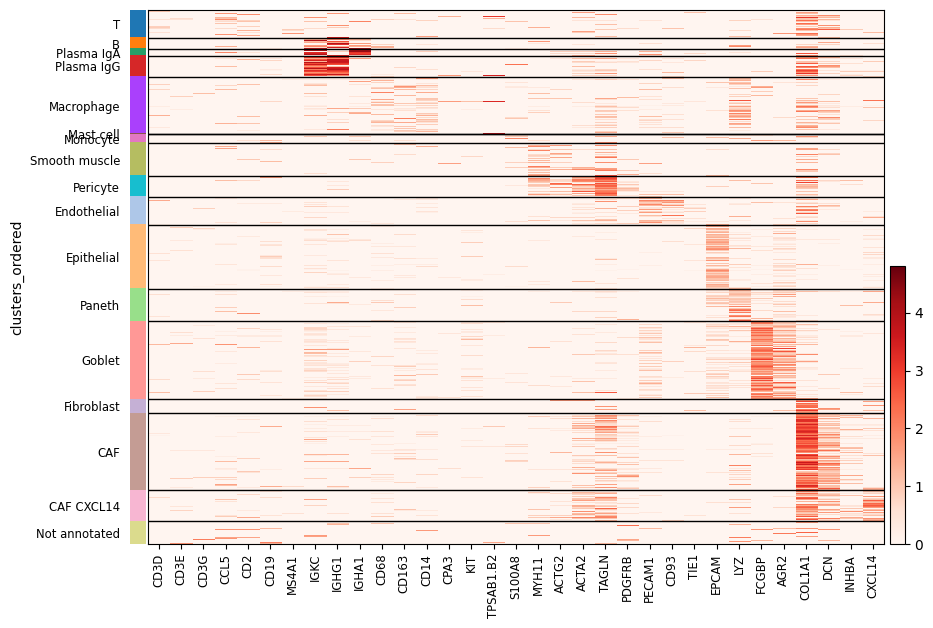

In [60]:
sc.pl.heatmap(adata2, var_names=markers, groupby='clusters_ordered',show_gene_labels=True, save = 'expression_heatmap.pdf',figsize=(10,7),cmap='Reds')

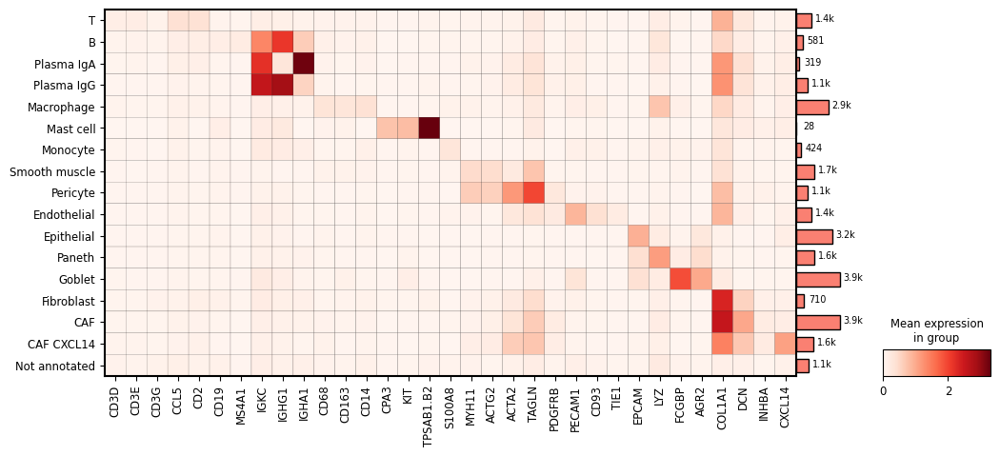

In [61]:
mp = sc.pl.matrixplot(adata2, markers, 'clusters_ordered', return_fig=True,figsize=(12,5))
mp.add_totals().style(edge_color='black',cmap='Reds')
mp.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/matrixplot.pdf',bbox_inches="tight")

# DEGs between cells of the same cell type, high vs low iNKT22 level

In [74]:
pd.unique(adata2.obs.leiden)

['Not annotated', 'Macrophage', 'T', 'CAF', 'Paneth', ..., 'Plasma IgG', 'B', 'Smooth muscle', 'Mast cell', 'Plasma IgA']
Length: 17
Categories (17, object): ['B', 'CAF', 'CAF CXCL14', 'Endothelial', ..., 'Plasma IgA', 'Plasma IgG', 'Smooth muscle', 'T']

In [20]:
adata_B = adata2[adata2.obs.leiden =='B']
adata_CAF = adata2[adata2.obs.leiden =='CAF']
adata_CAF_CXCL14 = adata2[adata2.obs.leiden =='CAF CXCL14']
adata_endo = adata2[adata2.obs.leiden =='Endothelial']
adata_epi = adata2[adata2.obs.leiden =='Epithelial']
adata_fibro = adata2[adata2.obs.leiden =='Fibroblast']
adata_goblet = adata2[adata2.obs.leiden =='Goblet']
adata_macro = adata2[adata2.obs.leiden =='Macrophage']
adata_mast = adata2[adata2.obs.leiden =='Mast cell']
adata_mono = adata2[adata2.obs.leiden =='Monocyte']
adata_paneth = adata2[adata2.obs.leiden =='Paneth']
adata_peri = adata2[adata2.obs.leiden =='Pericyte']
adata_plasma_A = adata2[adata2.obs.leiden =='Plasma IgA']
adata_plasma_G = adata2[adata2.obs.leiden =='Plasma IgG']
adata_muscle = adata2[adata2.obs.leiden =='Smooth muscle']
adata_T = adata2[adata2.obs.leiden =='T']

In [21]:
sc.tl.rank_genes_groups(adata_B, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_B = sc.get.rank_genes_groups_df(adata_B, group='LOW',key = "rank_genes_groups")
df_adata_B.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_B_low_high.xlsx')

sc.tl.rank_genes_groups(adata_CAF, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_CAF = sc.get.rank_genes_groups_df(adata_CAF, group='LOW',key = "rank_genes_groups")
df_adata_CAF.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_CAF_low_high.xlsx')

sc.tl.rank_genes_groups(adata_CAF_CXCL14, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_CAF_CXCL14 = sc.get.rank_genes_groups_df(adata_CAF_CXCL14, group='LOW',key = "rank_genes_groups")
df_adata_CAF_CXCL14.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_CAF_CXCL14_low_high.xlsx')

sc.tl.rank_genes_groups(adata_endo, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_endo = sc.get.rank_genes_groups_df(adata_endo, group='LOW',key = "rank_genes_groups")
df_adata_endo.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_endo_low_high.xlsx')

sc.tl.rank_genes_groups(adata_epi, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_epi = sc.get.rank_genes_groups_df(adata_epi, group='LOW',key = "rank_genes_groups")
df_adata_epi.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_epi_low_high.xlsx')

sc.tl.rank_genes_groups(adata_fibro, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_fibro = sc.get.rank_genes_groups_df(adata_fibro, group='LOW',key = "rank_genes_groups")
df_adata_fibro.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_fibro_low_high.xlsx')

sc.tl.rank_genes_groups(adata_goblet, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_goblet = sc.get.rank_genes_groups_df(adata_goblet, group='LOW',key = "rank_genes_groups")
df_adata_goblet.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_goblet_low_high.xlsx')

sc.tl.rank_genes_groups(adata_macro, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_macro = sc.get.rank_genes_groups_df(adata_macro, group='LOW',key = "rank_genes_groups")
df_adata_macro.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_macro_low_high.xlsx')

sc.tl.rank_genes_groups(adata_mast, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_mast = sc.get.rank_genes_groups_df(adata_mast, group='LOW',key = "rank_genes_groups")
df_adata_mast.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_mast_low_high.xlsx')

sc.tl.rank_genes_groups(adata_mono, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_mono = sc.get.rank_genes_groups_df(adata_mono, group='LOW',key = "rank_genes_groups")
df_adata_mono.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_mono_low_high.xlsx')

sc.tl.rank_genes_groups(adata_paneth, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_paneth = sc.get.rank_genes_groups_df(adata_paneth, group='LOW',key = "rank_genes_groups")
df_adata_paneth.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_paneth_low_high.xlsx')

sc.tl.rank_genes_groups(adata_peri, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_peri = sc.get.rank_genes_groups_df(adata_peri, group='LOW',key = "rank_genes_groups")
df_adata_peri.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_peri_low_high.xlsx')

sc.tl.rank_genes_groups(adata_plasma_A, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_plasma_A = sc.get.rank_genes_groups_df(adata_plasma_A, group='LOW',key = "rank_genes_groups")
df_adata_plasma_A.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_plasma_A_low_high.xlsx')

sc.tl.rank_genes_groups(adata_plasma_G, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_plasma_G = sc.get.rank_genes_groups_df(adata_plasma_G, group='LOW',key = "rank_genes_groups")
df_adata_plasma_G.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_plasma_G_low_high.xlsx')

sc.tl.rank_genes_groups(adata_muscle, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_muscle = sc.get.rank_genes_groups_df(adata_muscle, group='LOW',key = "rank_genes_groups")
df_adata_muscle.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_muscle_low_high.xlsx')

sc.tl.rank_genes_groups(adata_T, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
df_adata_T = sc.get.rank_genes_groups_df(adata_T, group='LOW',key = "rank_genes_groups")
df_adata_T.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_T_low_high.xlsx')


/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/tools/_rank_g

In [25]:
a = adata_goblet[adata_goblet.obs.level =='HIGH'].obs.index

In [26]:
b = pd.DataFrame(adata_goblet.X.toarray(), index= adata_goblet.obs.index, columns = adata_goblet.var.index)
b.loc[a,'FN1'].mean()

1.0489862833811534

In [27]:
a = adata_goblet[adata_goblet.obs.level =='LOW'].obs.index
b = pd.DataFrame(adata_goblet.X.toarray(), index= adata_goblet.obs.index, columns = adata_goblet.var.index)
b.loc[a,'FN1'].mean()

0.05101307117387765

### Identification of T cells with high expression of ZBTB16 
Identification of epithelial, fibroblasts, CAF and CAF CXCL14+ within 500 micro from these iNKT cells

In [25]:
gene_expression_all_cells_T_cells = adata2[adata2.obs.leiden == 'T'].obs.index.values
gene_expression_all_cells = pd.DataFrame(adata2.X.toarray(),index = adata2.obs.index.values, columns = adata2.var.index.values)

gene_expression_T_cells= gene_expression_all_cells.loc[gene_expression_all_cells_T_cells]
gene_expression_T_cells

,RAMP2,CD83,RYK,CD5L,NLRP2,BIRC5,LIF,H2AZ1,PTGES3,CDH11,...,PTEN,PXDN,RGS13,SLA,SLCO2B1,SQLE,SRSF2,TGFBI,TPI1,ZBTB16
3_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.926547,0.0
8_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
58_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
59_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
67_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.965604,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1642_20,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
1648_20,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
1651_20,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
1684_20,0.0,1.528175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.528175,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [59]:
gene_expression_T_cells['ZBTB16'][gene_expression_T_cells['ZBTB16'] > 0.1]
gene_expression_T_cells['ZBTB16'].max()

2.2467703138876494

In [26]:
adata_low = adata2[adata2.obs.level == 'LOW']
adata_high = adata2[adata2.obs.level == 'HIGH']

In [51]:
# for each fov, compute the how many T cells express ZBTB16 > 0 

fov_ZBTB16_low = {}

for fov in pd.unique(adata_low.obs.fov):
    adata_fov = adata_low[adata_low.obs.fov == fov]
    index_T_cells = adata_fov[adata_fov.obs.leiden == 'T'].obs.index.values
    gene_expression_fov_all_cells = pd.DataFrame(adata_fov.X.toarray(),index = adata_fov.obs.index.values, columns = adata_fov.var.index.values)
    gene_expression_fov_T = gene_expression_fov_all_cells.loc[index_T_cells]
    T_cells_ZBTB16 = gene_expression_fov_T['ZBTB16'][gene_expression_fov_T['ZBTB16'] > 0].index.values
    fov_ZBTB16_low[fov] = len(T_cells_ZBTB16)

In [27]:
fov_ZBTB16_low = {}

for fov in pd.unique(adata_low.obs.fov):
    adata_fov = adata_low[adata_low.obs.fov == fov]
    index_T_cells = adata_fov[adata_fov.obs.leiden == 'T'].obs.index.values
    gene_expression_fov_all_cells = pd.DataFrame(adata_fov.X.toarray(),index = adata_fov.obs.index.values, columns = adata_fov.var.index.values)
    gene_expression_fov_T = gene_expression_fov_all_cells.loc[index_T_cells]
    T_cells_ZBTB16 = gene_expression_fov_T['ZBTB16'][gene_expression_fov_T['ZBTB16'] > 0].index.values
    gene_expression_fov_T_ZBTB16 = gene_expression_fov_all_cells.loc[T_cells_ZBTB16]
    T_cells_ZBTB16_AHR = gene_expression_fov_T_ZBTB16['AHR'][gene_expression_fov_T['AHR'] > 0].index.values
    T_cells_AHR= gene_expression_fov_T['AHR'][gene_expression_fov_T['AHR'] > 0].index.values
    fov_ZBTB16_low[fov] = [len(T_cells_ZBTB16), len(T_cells_AHR), len(T_cells_ZBTB16_AHR)]

In [28]:
fov_ZBTB16_low

{'1': [0, 1, 0],
 '9': [2, 4, 0],
 '10': [0, 1, 0],
 '11': [1, 0, 0],
 '14': [3, 2, 0],
 '16': [0, 2, 0],
 '17': [4, 1, 0],
 '18': [1, 1, 0],
 '19': [0, 0, 0],
 '20': [1, 0, 0]}

In [36]:
# for each fov, compute the how many T cells express ZBTB16 > 0.1 and how many of them express IL10 > 0.1 

fov_ZBTB16_high = {}

for fov in pd.unique(adata_high.obs.fov):
    adata_fov = adata_high[adata_high.obs.fov == fov]
    index_T_cells = adata_fov[adata_fov.obs.leiden == 'T'].obs.index.values
    gene_expression_fov_all_cells = pd.DataFrame(adata_fov.X.toarray(),index = adata_fov.obs.index.values, columns = adata_fov.var.index.values)
    gene_expression_fov_T = gene_expression_fov_all_cells.loc[index_T_cells]
    T_cells_ZBTB16 = gene_expression_fov_T['ZBTB16'][gene_expression_fov_T['ZBTB16'] > 0].index.values
    gene_expression_fov_T_ZBTB16 = gene_expression_fov_all_cells.loc[T_cells_ZBTB16]
    T_cells_ZBTB16_AHR = gene_expression_fov_T_ZBTB16['AHR'][gene_expression_fov_T['AHR'] > 0].index.values
    T_cells_AHR = gene_expression_fov_T['AHR'][gene_expression_fov_T['AHR'] > 0].index.values
    fov_ZBTB16_high[fov] = [len(T_cells_ZBTB16), len(T_cells_AHR),len(T_cells_ZBTB16_AHR)]

In [37]:
fov_ZBTB16_high

{'4': [5, 6, 0],
 '5': [4, 9, 0],
 '6': [15, 10, 2],
 '7': [1, 4, 0],
 '8': [3, 3, 1],
 '12': [5, 1, 0],
 '13': [4, 1, 0]}

In [53]:
# for each fov identify the percentage of the epithelial/fibroblast/CAF/CAF CXCL14 cells closer that x micro from T cells ZBTB16 > 0
# and the percentage of the epithelial/fibroblast/CAF/CAF CXCL14 cells farther that x micro

def percentage_cells(level, distance):
    epithelial_less_ZBTB16 = []
    fibroblast_less_ZBTB16 = []
    CAF_less_ZBTB16 = []
    CAF_CXCL14_less_ZBTB16 = []
    epithelial_more_ZBTB16 = []
    fibroblast_more_ZBTB16 = []
    CAF_more_ZBTB16 = []
    CAF_CXCL14_more_ZBTB16 = []

    if level == 'high':
        adata = adata_high
    else:
        adata = adata_low
        
    for fov in pd.unique(adata.obs.fov):
        adata_fov = adata[adata.obs.fov == fov]
        index_T_cells = adata_fov[adata_fov.obs.leiden == 'T'].obs.index.values
        gene_expression_fov_all_cells = pd.DataFrame(adata_fov.X.toarray(),index = adata_fov.obs.index.values, columns = adata_fov.var.index.values)
        gene_expression_fov_T = gene_expression_fov_all_cells.loc[index_T_cells]
        T_cells_ZBTB16 = gene_expression_fov_T['ZBTB16'][gene_expression_fov_T['ZBTB16'] > 0].index.values
        
        pos = adata_fov.obs[['CenterX_global_px','CenterY_global_px']]
        dm = pd.DataFrame(distance_matrix(pos, pos), index = pos.index.values, columns = pos.index.values)

        epithelial_less_ZBTB16_fov = []
        fibroblast_less_ZBTB16_fov = []
        CAF_less_ZBTB16_fov = []
        CAF_CXCL14_less_ZBTB16_fov = []
        
        for cell_ZBTB16 in T_cells_ZBTB16:
            dm_cell = dm[cell_ZBTB16]
            dm_cell_less = dm_cell[dm_cell <= distance].index.values
            
            epithelial_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'Epithelial'].index.values
            if len(epithelial_less) > 0:
                epithelial_less_ZBTB16_fov.extend(epithelial_less)
            fibroblast_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'Fibroblast'].index.values
            if len(fibroblast_less) > 0:    
                fibroblast_less_ZBTB16_fov.extend(fibroblast_less)
            CAF_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'CAF'].index.values
            if len(CAF_less) > 0:    
                CAF_less_ZBTB16_fov.extend(CAF_less)
            CAF_CXCL14_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'CAF CXCL14'].index.values
            if len(CAF_CXCL14_less) > 0:    
                CAF_CXCL14_less_ZBTB16_fov.extend(CAF_CXCL14_less)

        epithelial_more_ZBTB16_fov = []
        fibroblast_more_ZBTB16_fov = []
        CAF_more_ZBTB16_fov = []
        CAF_CXCL14_more_ZBTB16_fov = []

        index_epithelial_cells = adata_fov[adata_fov.obs.leiden == 'Epithelial'].obs.index.values
        index_fibroblast_cells = adata_fov[adata_fov.obs.leiden == 'Fibroblast'].obs.index.values
        index_CAF_cells = adata_fov[adata_fov.obs.leiden == 'CAF'].obs.index.values
        index_CAF_CXCL14_cells = adata_fov[adata_fov.obs.leiden == 'CAF CXCL14'].obs.index.values

        for c in index_epithelial_cells:
            if c not in np.unique(epithelial_less_ZBTB16_fov):
                epithelial_more_ZBTB16_fov.append(c)
        
        for c in index_fibroblast_cells:
            if c not in np.unique(fibroblast_less_ZBTB16_fov):
                fibroblast_more_ZBTB16_fov.append(c)
        
        for c in index_CAF_cells:
            if c not in np.unique(CAF_less_ZBTB16_fov):
                CAF_more_ZBTB16_fov.append(c)
        
        for c in index_CAF_CXCL14_cells:
            if c not in np.unique(CAF_CXCL14_less_ZBTB16_fov):
                CAF_CXCL14_more_ZBTB16_fov.append(c)
        
        if len(adata_fov[adata_fov.obs.leiden == 'Epithelial']) != 0:
            epithelial_less_ZBTB16.append(len(np.unique(epithelial_less_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'Epithelial']))
            epithelial_more_ZBTB16.append(len(np.unique(epithelial_more_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'Epithelial']))

        if len(adata_fov[adata_fov.obs.leiden == 'Fibroblast']) != 0:
            fibroblast_less_ZBTB16.append(len(np.unique(fibroblast_less_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'Fibroblast']))
            fibroblast_more_ZBTB16.append(len(np.unique(fibroblast_more_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'Fibroblast']))

        if len(adata_fov[adata_fov.obs.leiden == 'CAF']) != 0:
            CAF_less_ZBTB16.append(len(np.unique(CAF_less_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'CAF']))
            CAF_more_ZBTB16.append(len(np.unique(CAF_more_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'CAF']))

        if len(adata_fov[adata_fov.obs.leiden == 'CAF CXCL14']) != 0:
            CAF_CXCL14_less_ZBTB16.append(len(np.unique(CAF_CXCL14_less_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'CAF CXCL14']))
            CAF_CXCL14_more_ZBTB16.append(len(np.unique(CAF_CXCL14_more_ZBTB16_fov))*100/len(adata_fov[adata_fov.obs.leiden == 'CAF CXCL14']))
  
    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_epithelial_less_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in epithelial_less_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_fibroblast_less_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in fibroblast_less_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_CAF_less_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in CAF_less_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_CAF_CXCL14_less_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in CAF_CXCL14_less_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_epithelial_more_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in epithelial_more_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_fibroblast_more_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in fibroblast_more_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_CAF_more_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in CAF_more_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/number_CAF_CXCL14_more_" + level + '_' +  str(distance) + "_T_ZBTB16", "w") as file:
        for row in CAF_CXCL14_more_ZBTB16:
                s = "".join(map(str, str(row)))
                file.write(s+'\n')


In [54]:
percentage_cells('low', 500)
percentage_cells('high', 500)
percentage_cells('low', 100)
percentage_cells('high', 100)
percentage_cells('low', 1000)
percentage_cells('high', 1000)

/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_5208/1036390152.py:62: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if c not in np.unique(epithelial_less_ZBTB16_fov):
/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_5208/1036390152.py:66: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if c not in np.unique(fibroblast_less_ZBTB16_fov):
/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_5208/1036390152.py:70: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if c not in np.unique(CAF_less_ZBTB16_fov):
/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_5208/1036390152.py:74: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if c not in np

In [55]:
# for each fov identify the id of the epithelial/fibroblast/CAF/CAF CXCL14 cells closer that x nm from T cells ZBTB16 > 0 
# and the id of the epithelial/fibroblast/CAF/CAF CXCL14 cells farther that x nm

def id_cells_within(level, distance):
    epithelial_less_ZBTB16 = []
    fibroblast_less_ZBTB16 = []
    CAF_less_ZBTB16 = []
    CAF_CXCL14_less_ZBTB16 = []

    if level == 'high':
        adata = adata_high
    else:
        adata = adata_low
        
    for fov in pd.unique(adata.obs.fov):
        adata_fov = adata[adata.obs.fov == fov]
        index_T_cells = adata_fov[adata_fov.obs.leiden == 'T'].obs.index.values
        gene_expression_fov_all_cells = pd.DataFrame(adata_fov.X.toarray(),index = adata_fov.obs.index.values, columns = adata_fov.var.index.values)
        gene_expression_fov_T = gene_expression_fov_all_cells.loc[index_T_cells]
        T_cells_ZBTB16 = gene_expression_fov_T['ZBTB16'][gene_expression_fov_T['ZBTB16'] > 0].index.values
        
        pos = adata_fov.obs[['CenterX_global_px','CenterY_global_px']]
        dm = pd.DataFrame(distance_matrix(pos, pos), index = pos.index.values, columns = pos.index.values)
     
        for cell_ZBTB16 in T_cells_ZBTB16:
            adata2.obs.loc[cell_ZBTB16,'within_'+str(distance)] = 'T ZBTB16+'
            dm_cell = dm[cell_ZBTB16]
            dm_cell_less = dm_cell[dm_cell <= distance].index.values
            
            epithelial_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'Epithelial'].index.values
            if len(epithelial_less) > 0:
                epithelial_less_ZBTB16.extend(epithelial_less)
            fibroblast_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'Fibroblast'].index.values
            if len(fibroblast_less) > 0:    
                fibroblast_less_ZBTB16.extend(fibroblast_less)
            CAF_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'CAF'].index.values
            if len(CAF_less) > 0:    
                CAF_less_ZBTB16.extend(CAF_less)
            CAF_CXCL14_less = adata_fov.obs.loc[dm_cell_less].leiden[adata_fov.obs.loc[dm_cell_less].leiden == 'CAF CXCL14'].index.values
            if len(CAF_CXCL14_less) > 0:    
                CAF_CXCL14_less_ZBTB16.extend(CAF_CXCL14_less)
    
    for c in epithelial_less_ZBTB16:
        adata2.obs.loc[c,'within_'+str(distance)] = 'epithelial_within_'+str(distance)+'_ZBTB16'
        adata2.obs.loc[c,'epithelial_'+str(distance) +'_ZBTB16'] = 'within'

    for c in fibroblast_less_ZBTB16:
        adata2.obs.loc[c,'within_'+str(distance)] = 'fibroblast_within_'+str(distance)+'_ZBTB16'
        adata2.obs.loc[c,'fibroblast_'+str(distance) +'_ZBTB16'] = 'within'

    for c in CAF_less_ZBTB16:
        adata2.obs.loc[c,'within_'+str(distance)] = 'CAF_within_'+str(distance)+'_ZBTB16'
        adata2.obs.loc[c,'CAF_'+str(distance) +'_ZBTB16'] = 'within'

    for c in CAF_CXCL14_less_ZBTB16:
        adata2.obs.loc[c,'within_'+str(distance)] = 'CAF CXCL14_within_'+str(distance)+'_ZBTB16'
        adata2.obs.loc[c,'CAF CXCL14_'+str(distance) +'_ZBTB16'] = 'within'
    
    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/epithelial_less_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in np.unique(epithelial_less_ZBTB16):
                s = "".join(map(str, row))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/fibroblast_less_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in np.unique(fibroblast_less_ZBTB16):
                s = "".join(map(str, row))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/CAF_less_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in np.unique(CAF_less_ZBTB16):
                s = "".join(map(str, row))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/CAF_CXCL14_less_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in np.unique(CAF_CXCL14_less_ZBTB16):
                s = "".join(map(str, row))
                file.write(s+'\n')

    epithelial_more_ZBTB16 = []
    fibroblast_more_ZBTB16 = []
    CAF_more_ZBTB16 = []
    CAF_CXCL14_more_ZBTB16 = []

    for fov in pd.unique(adata.obs.fov):
        adata_fov = adata[adata.obs.fov == fov]
        index_epithelial_cells = adata_fov[adata_fov.obs.leiden == 'Epithelial'].obs.index.values
        index_fibroblast_cells = adata_fov[adata_fov.obs.leiden == 'Fibroblast'].obs.index.values
        index_CAF_cells = adata_fov[adata_fov.obs.leiden == 'CAF'].obs.index.values
        index_CAF_CXCL14_cells = adata_fov[adata_fov.obs.leiden == 'CAF CXCL14'].obs.index.values

        for c in index_epithelial_cells:
            if c not in np.unique(epithelial_less_ZBTB16):
                epithelial_more_ZBTB16.append(c)

        for c in index_fibroblast_cells:
            if c not in np.unique(fibroblast_less_ZBTB16):
                fibroblast_more_ZBTB16.append(c)

        for c in index_CAF_cells:
            if c not in np.unique(CAF_less_ZBTB16):
                CAF_more_ZBTB16.append(c)

        for c in index_CAF_CXCL14_cells:
            if c not in np.unique(CAF_CXCL14_less_ZBTB16):
                CAF_CXCL14_more_ZBTB16.append(c)
        
    
    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/epithelial_more_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in epithelial_more_ZBTB16:
                s = "".join(map(str, row))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/fibroblast_more_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in fibroblast_more_ZBTB16:
                s = "".join(map(str, row))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/CAF_more_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in CAF_more_ZBTB16:
                s = "".join(map(str, row))
                file.write(s+'\n')

    with open("/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/CAF_CXCL14_more_" + level + '_' + str(distance) + "_T_ZBTB16", "w") as file:
        for row in CAF_CXCL14_more_ZBTB16:
                s = "".join(map(str, row))
                file.write(s+'\n')

    for c in epithelial_more_ZBTB16:
        adata2.obs.loc[c,'epithelial_'+str(distance) +'_ZBTB16'] = 'farther'
    
    for c in fibroblast_more_ZBTB16:
        adata2.obs.loc[c,'fibroblast_'+str(distance) +'_ZBTB16'] = 'farther'

    for c in CAF_more_ZBTB16:
        adata2.obs.loc[c,'CAF_'+str(distance) +'_ZBTB16'] = 'farther'
    
    for c in CAF_CXCL14_more_ZBTB16:
        adata2.obs.loc[c,'CAF CXCL14_'+str(distance) +'_ZBTB16'] = 'farther'


In [56]:
id_cells_within('high', 100)
id_cells_within('low', 100)
id_cells_within('high', 500)
id_cells_within('low', 500)
id_cells_within('high', 1000)
id_cells_within('low', 1000)

/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_5208/1048384199.py:104: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if c not in np.unique(CAF_CXCL14_less_ZBTB16):


In [57]:
adata_sub_100 = adata2[adata2.obs['within_100'].notna()]
adata_sub_500 = adata2[adata2.obs['within_500'].notna()]
adata_sub_1000 = adata2[adata2.obs['within_1000'].notna()]

In [20]:
np.array(pd.unique(adata_sub_100.obs['fov']))

array(['4', '5', '6', '7', '8', '9', '11', '12', '13', '14', '17', '18',
       '20'], dtype=object)

In [21]:
t_100 = ['fov 11 - Patient_6 - LOW','fov 12 - Patient_7 - HIGH',
     'fov 13 - Patient_7 - HIGH',
    'fov 14 - Patient_8 - LOW',
 'fov 17 - Patient_8 - LOW',
 'fov 18 - Patient_9 - LOW',
     'fov 20 - Patient_9 - LOW',
     'fov 4 - Patient_2 - HIGH',
     'fov 5 - Patient_2 - HIGH',
     'fov 6 - Patient_4 - HIGH',
 'fov 7 - Patient_4 - HIGH',
 'fov 8 - Patient_4 - HIGH',
'fov 9 - Patient_6 - LOW']

In [22]:
np.array(pd.unique(adata_sub_500.obs['fov']))

array(['4', '5', '6', '7', '8', '9', '11', '12', '13', '14', '17', '18',
       '20'], dtype=object)

In [23]:
t_500 = ['fov 11 - Patient_6 - LOW','fov 12 - Patient_7 - HIGH',
     'fov 13 - Patient_7 - HIGH',
    'fov 14 - Patient_8 - LOW',
 'fov 17 - Patient_8 - LOW',
 'fov 18 - Patient_9 - LOW',
     'fov 20 - Patient_9 - LOW',
     'fov 4 - Patient_2 - HIGH',
     'fov 5 - Patient_2 - HIGH',
     'fov 6 - Patient_4 - HIGH',
 'fov 7 - Patient_4 - HIGH',
 'fov 8 - Patient_4 - HIGH',
'fov 9 - Patient_6 - LOW']

In [24]:
np.array(pd.unique(adata_sub_1000.obs['fov']))

array(['4', '5', '6', '7', '8', '9', '11', '12', '13', '14', '17', '18',
       '20'], dtype=object)

In [25]:
t_1000 = ['fov 11 - Patient_6 - LOW','fov 12 - Patient_7 - HIGH',
     'fov 13 - Patient_7 - HIGH',
    'fov 14 - Patient_8 - LOW',
 'fov 17 - Patient_8 - LOW',
 'fov 18 - Patient_9 - LOW',
     'fov 20 - Patient_9 - LOW',
     'fov 4 - Patient_2 - HIGH',
     'fov 5 - Patient_2 - HIGH',
     'fov 6 - Patient_4 - HIGH',
 'fov 7 - Patient_4 - HIGH',
 'fov 8 - Patient_4 - HIGH',
'fov 9 - Patient_6 - LOW']

In [26]:
pd.unique(adata_sub_100.obs['within_100'])

array(['T ZBTB16+', 'CAF_within_100_ZBTB16',
       'epithelial_within_100_ZBTB16', 'fibroblast_within_100_ZBTB16',
       'CAF CXCL14_within_100_ZBTB16'], dtype=object)

In [27]:
palette = ['#F0E442','#000000', '#56B4E9', '#D55E00',  '#0072B2' ]

sns.color_palette(palette)

[(0.9411764705882353, 0.8941176470588236, 0.25882352941176473),
 (0.0, 0.0, 0.0),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.0, 0.4470588235294118, 0.6980392156862745)]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing 

<Axes: title={'center': 'within_100'}, xlabel='UMAP1', ylabel='UMAP2'>

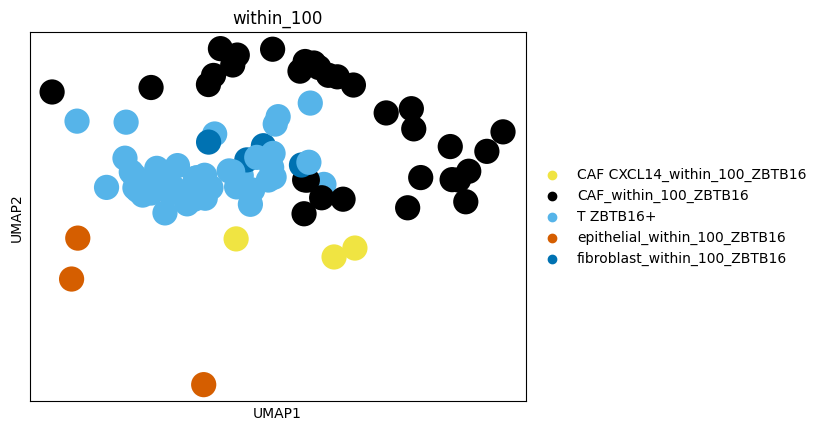

In [28]:
sc.pl.umap(
    adata_sub_100, show=False,
    color= "within_100", palette=sns.color_palette(palette, 5)
)

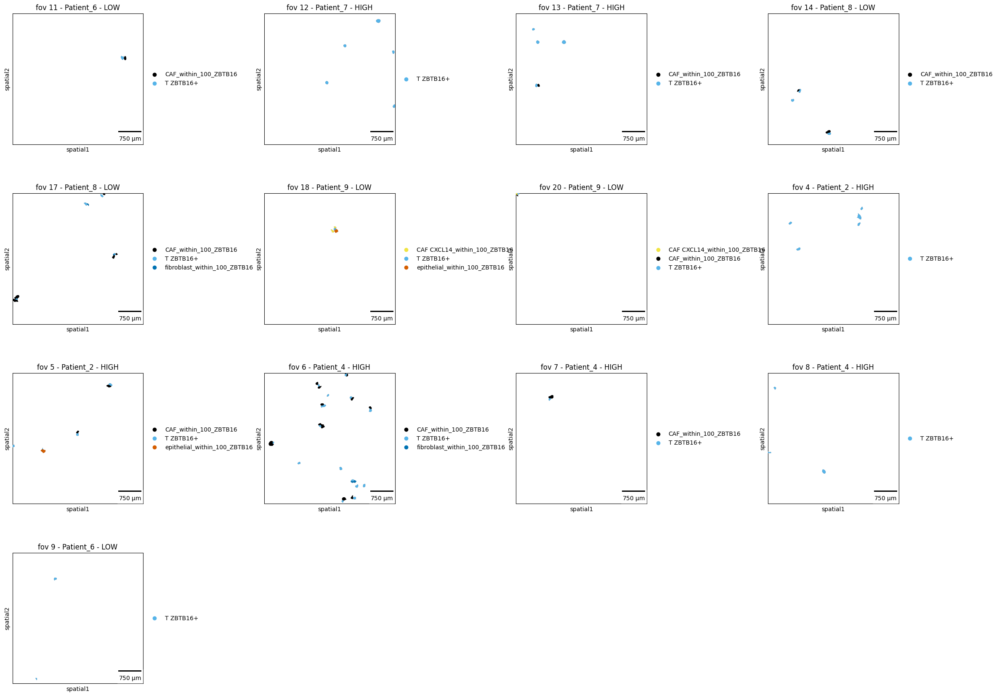

In [29]:
sq.pl.spatial_segment(
    adata_sub_100,
    color='within_100',
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True,
    img=False,
    scalebar_dx=1.0,
    title = t_100, 
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"}
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/fov_patients_within100_senza_back.pdf',bbox_inches="tight")

In [30]:
pd.unique(adata_sub_500.obs['within_500'])

array(['CAF_within_500_ZBTB16', 'CAF CXCL14_within_500_ZBTB16',
       'fibroblast_within_500_ZBTB16', 'T ZBTB16+',
       'epithelial_within_500_ZBTB16'], dtype=object)

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing 

<Axes: title={'center': 'within_500'}, xlabel='UMAP1', ylabel='UMAP2'>

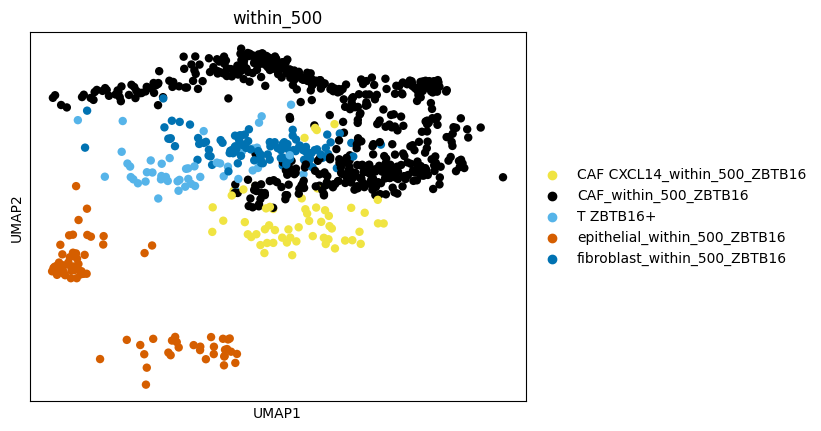

In [31]:
sc.pl.umap(
    adata_sub_500, show=False,
    color= "within_500", palette=sns.color_palette(palette, 5)
)

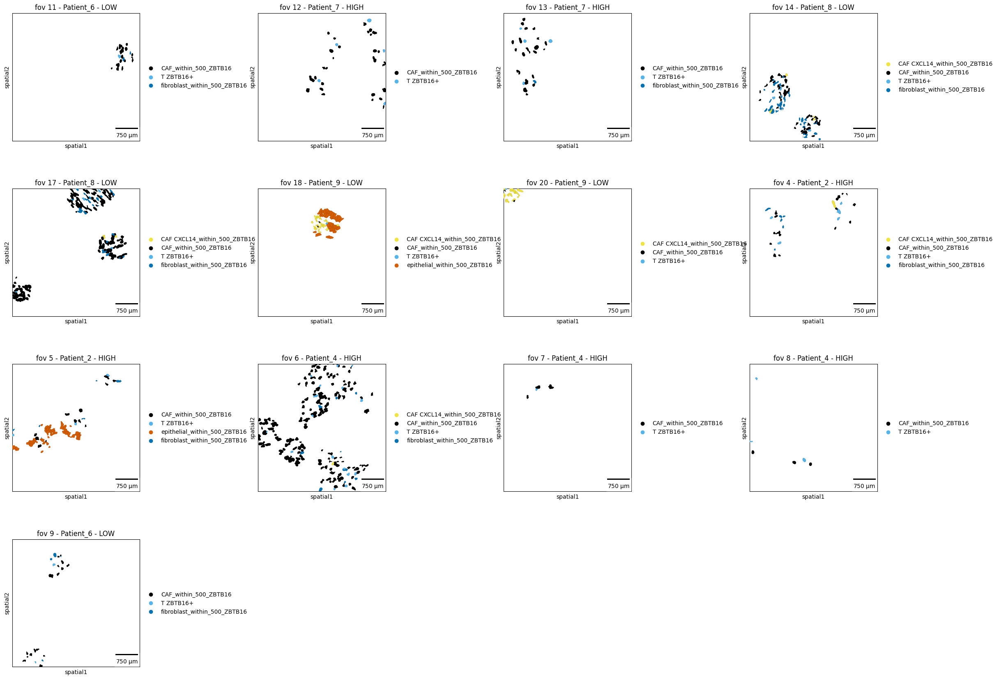

In [32]:
sq.pl.spatial_segment(
    adata_sub_500,
    color='within_500',
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True,
    img=False,
    scalebar_dx=1.0,
    title = t_500, 
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"}
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/fov_patients_within500_senza_back.pdf',bbox_inches="tight")

In [33]:
pd.unique(adata_sub_1000.obs['within_1000'])

array(['fibroblast_within_1000_ZBTB16', 'CAF_within_1000_ZBTB16',
       'CAF CXCL14_within_1000_ZBTB16', 'T ZBTB16+',
       'epithelial_within_1000_ZBTB16'], dtype=object)

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing 

<Axes: title={'center': 'within_1000'}, xlabel='UMAP1', ylabel='UMAP2'>

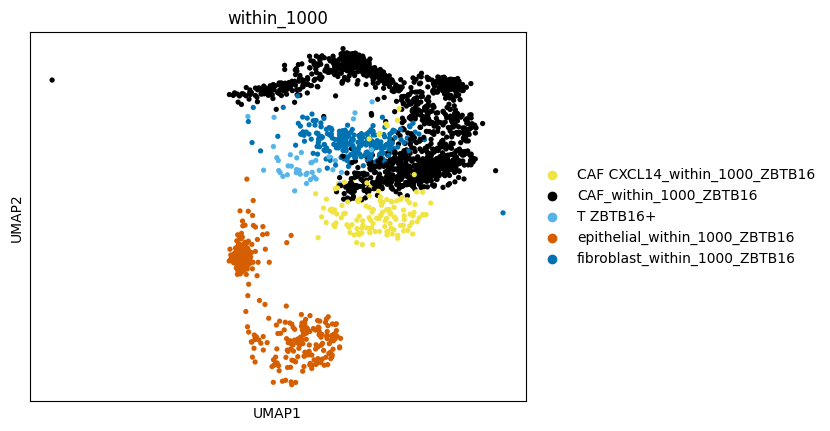

In [34]:
sc.pl.umap(
    adata_sub_1000, show=False,
    color= "within_1000", palette=sns.color_palette(palette, 5)
)

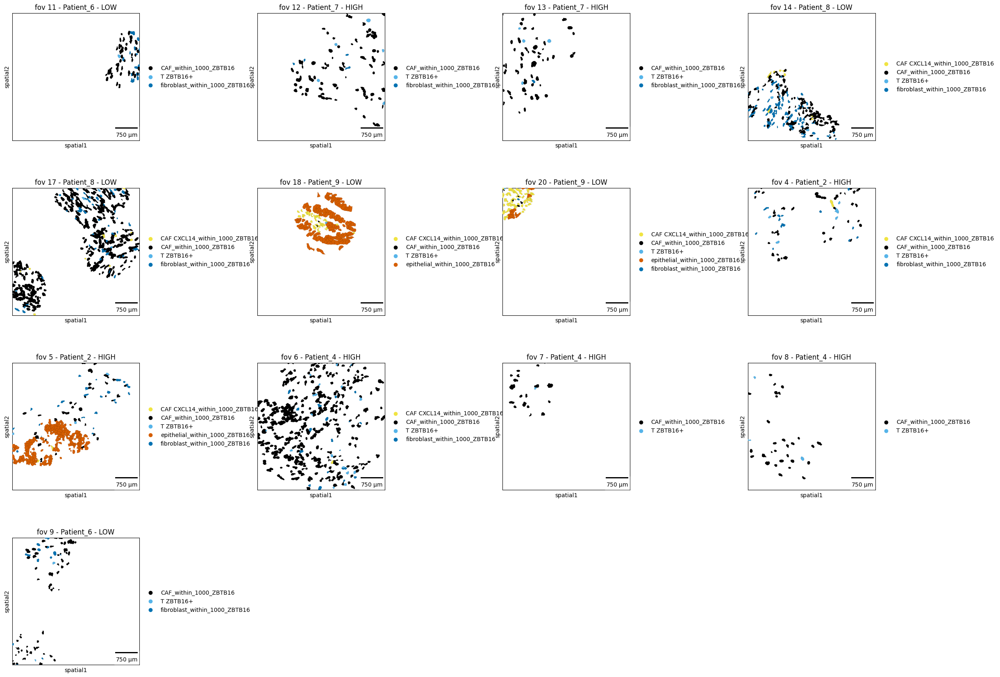

In [35]:
sq.pl.spatial_segment(
    adata_sub_1000,
    color='within_1000',
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True,
    img=False,
    scalebar_dx=1.0,
    title = t_1000, 
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"}
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/fov_patients_within1000_senza_back.pdf',bbox_inches="tight")

### DEGs between epithelial cells/fibro/CAF/CAF CXCL14 within/farther than 100/500/10000 micro from T ZBTB16 

In [25]:
adata_low = adata2[adata2.obs.level == 'LOW']
adata_high = adata2[adata2.obs.level == 'HIGH']

In [39]:
sc.tl.rank_genes_groups(adata_low, 'epithelial_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_epi_low_500 = sc.get.rank_genes_groups_df(adata_low, group='within',key = "rank_genes_groups")
df_adata_epi_low_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_epithelial_within_farther_500_ZBTB16_low.xlsx')

sc.tl.rank_genes_groups(adata_high, 'epithelial_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_epi_high_500 = sc.get.rank_genes_groups_df(adata_high, group='within',key = "rank_genes_groups")
df_adata_epi_high_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_epithelial_within_farther_500_ZBTB16_high.xlsx')

sc.tl.rank_genes_groups(adata_low, 'fibroblast_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_fibro_low_500 = sc.get.rank_genes_groups_df(adata_low, group='within',key = "rank_genes_groups")
df_adata_fibro_low_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_fibro_within_farther_500_ZBTB16_low.xlsx')

sc.tl.rank_genes_groups(adata_high, 'fibroblast_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_fibro_high_500 = sc.get.rank_genes_groups_df(adata_high, group='within',key = "rank_genes_groups")
df_adata_fibro_high_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_fibro_within_farther_500_ZBTB16_high.xlsx')

sc.tl.rank_genes_groups(adata_low, 'CAF_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_CAF_low_500 = sc.get.rank_genes_groups_df(adata_low, group='within',key = "rank_genes_groups")
df_adata_CAF_low_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_CAF_within_farther_500_ZBTB16_low.xlsx')

sc.tl.rank_genes_groups(adata_high, 'CAF_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_CAF_high_500 = sc.get.rank_genes_groups_df(adata_high, group='within',key = "rank_genes_groups")
df_adata_CAF_high_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_CAF_within_farther_500_ZBTB16_high.xlsx')

sc.tl.rank_genes_groups(adata_low, 'CAF CXCL14_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_CAF_CXCL14_low_500 = sc.get.rank_genes_groups_df(adata_low, group='within',key = "rank_genes_groups")
df_adata_CAF_CXCL14_low_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_CAF_CXCL14_within_farther_500_ZBTB16_low.xlsx')

sc.tl.rank_genes_groups(adata_high, 'CAF CXCL14_500_ZBTB16', groups=['within'], reference='farther', method='wilcoxon')
df_adata_CAF_CXCL14_high_500 = sc.get.rank_genes_groups_df(adata_high, group='within',key = "rank_genes_groups")
df_adata_CAF_CXCL14_high_500.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_CAF_CXCL14_within_farther_500_ZBTB16_high.xlsx')


In [41]:
a = adata_high[adata_high.obs['epithelial_500_ZBTB16'] == 'within'].obs.index
a

Index(['362_5', '368_5', '369_5', '370_5', '377_5', '389_5', '390_5', '392_5',
       '397_5', '404_5', '405_5', '412_5', '415_5', '419_5', '420_5', '421_5',
       '423_5', '424_5', '443_5', '449_5', '450_5', '459_5', '461_5', '468_5',
       '486_5', '496_5', '498_5', '507_5', '511_5', '516_5', '517_5', '524_5',
       '540_5', '551_5', '564_5', '1541_5', '1562_5', '1573_5', '1598_5',
       '1610_5', '1622_5', '1632_5', '1667_5', '1725_5', '1732_5', '1745_5',
       '1757_5', '1761_5', '1792_5', '1823_5', '1824_5', '1833_5', '1880_5',
       '1912_5', '1958_5', '2038_5'],
      dtype='object')

In [64]:
a = adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'within'].obs.index
b = pd.DataFrame(adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'within'].X.toarray(), index= adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'within'].obs.index, columns = adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'within'].var.index)
b.loc[a,'TIMP1'].mean()

0.3296684870626034

In [65]:
a = adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'farther'].obs.index
b = pd.DataFrame(adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'farther'].X.toarray(), index= adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'farther'].obs.index, columns = adata_low[adata_low.obs['CAF_500_ZBTB16'] == 'farther'].var.index)
b.loc[a,'TIMP1'].mean()

0.5171805348741544

In [70]:
adata_high[adata_high.obs.leiden == 'CAF CXCL14']

View of AnnData object with n_obs × n_vars = 12 × 992
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.MembraneStain_B2M', 'Max.MembraneStain_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'Patients', 'group', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_counts', 'leiden', 'new_leiden', 'level', 'disease', 'T_CAF', 'clusters_ordered', 'within_100', 'epithelial_100_ZBTB16', 'fibroblast_100_ZBTB16', 'CAF_100_ZBTB16', 'CAF CXCL14_100_ZBTB16', 'within_500', 'epithelial_500_ZBTB16', 'fibroblast_500_ZBTB16', 'CAF_500_ZBTB16', 'CAF CXCL14_500_ZBTB16', 'within_1000', 'epithelial_1000_ZBTB16', 'fibroblast_1000_ZBTB16', 'CAF_1000_ZBT

In [71]:
adata_high[adata_high.obs['CAF CXCL14_500_ZBTB16'] =='farther']

View of AnnData object with n_obs × n_vars = 10 × 992
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.MembraneStain_B2M', 'Max.MembraneStain_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'Patients', 'group', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_counts', 'leiden', 'new_leiden', 'level', 'disease', 'T_CAF', 'clusters_ordered', 'within_100', 'epithelial_100_ZBTB16', 'fibroblast_100_ZBTB16', 'CAF_100_ZBTB16', 'CAF CXCL14_100_ZBTB16', 'within_500', 'epithelial_500_ZBTB16', 'fibroblast_500_ZBTB16', 'CAF_500_ZBTB16', 'CAF CXCL14_500_ZBTB16', 'within_1000', 'epithelial_1000_ZBTB16', 'fibroblast_1000_ZBTB16', 'CAF_1000_ZBT

In [79]:
adata_low[adata_low.obs['epithelial_500_ZBTB16'] =='farther']

View of AnnData object with n_obs × n_vars = 2840 × 992
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD68', 'Max.CD68', 'Mean.MembraneStain_B2M', 'Max.MembraneStain_B2M', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'Patients', 'group', 'cell_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_counts', 'leiden', 'new_leiden', 'level', 'disease', 'T_CAF', 'clusters_ordered', 'within_100', 'epithelial_100_ZBTB16', 'fibroblast_100_ZBTB16', 'CAF_100_ZBTB16', 'CAF CXCL14_100_ZBTB16', 'within_500', 'epithelial_500_ZBTB16', 'fibroblast_500_ZBTB16', 'CAF_500_ZBTB16', 'CAF CXCL14_500_ZBTB16', 'within_1000', 'epithelial_1000_ZBTB16', 'fibroblast_1000_ZBTB16', 'CAF_1000_Z

### Compare distance between cell types in high and low iNKT22 conditions

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing 

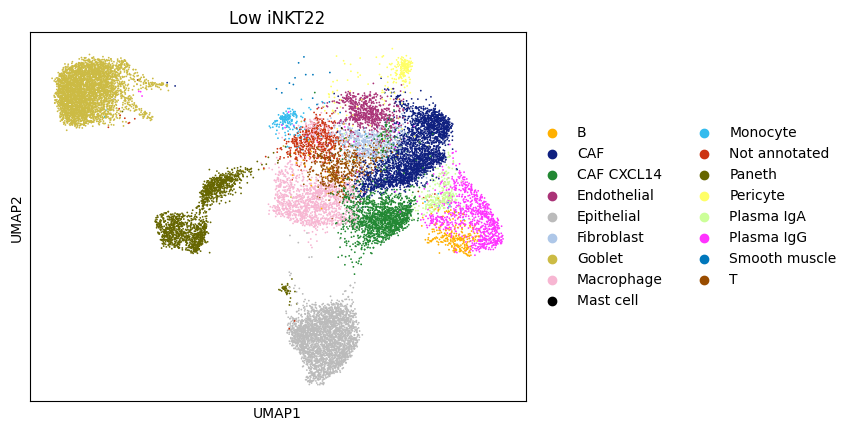

In [80]:
sc.pl.umap(
    adata_low, show=False,
    color= "leiden", palette=sns.color_palette(palette),
    title = 'Low iNKT22'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_clusters_named_low.pdf',bbox_inches="tight")

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


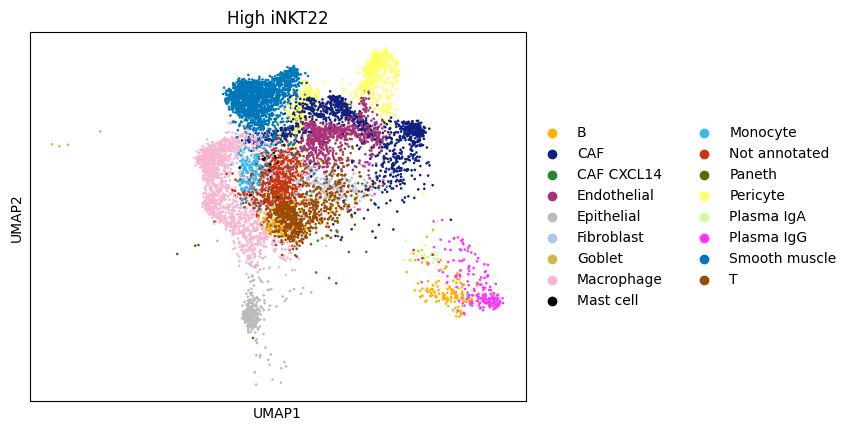

In [50]:
sc.pl.umap(
    adata_high, show=False,
    color= "leiden", palette=sns.color_palette(palette),
    title = 'High iNKT22'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/umap_clusters_named_high.pdf',bbox_inches="tight")

In [46]:
sq.gr.spatial_neighbors(adata_low, coord_type="generic", spatial_key="spatial")
sq.gr.nhood_enrichment(adata_low, cluster_key="leiden")
sq.gr.spatial_neighbors(adata_high, coord_type="generic", spatial_key="spatial")
sq.gr.nhood_enrichment(adata_high, cluster_key="leiden")

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


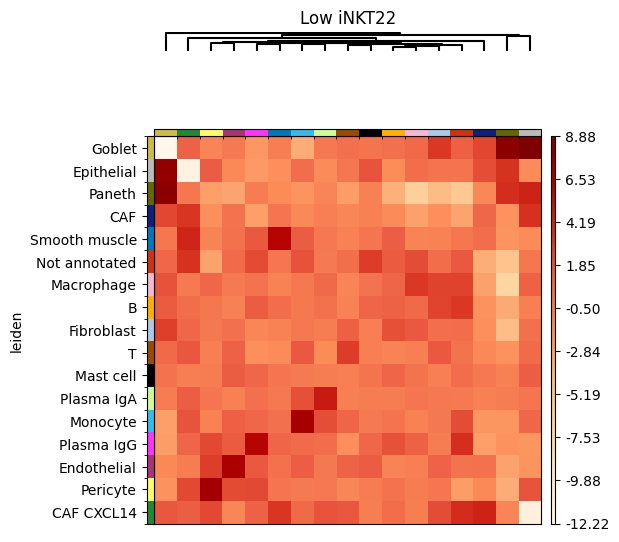

In [82]:
# plotted values are in adata_low.uns['leiden_nhood_enrichment']['zscore']

sq.pl.nhood_enrichment(
    adata_low,
    cluster_key="leiden",
    method="average", 
    cmap='OrRd',
    figsize=(5, 5),
    title = 'Low iNKT22'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/neighborhood_low.pdf',bbox_inches="tight")

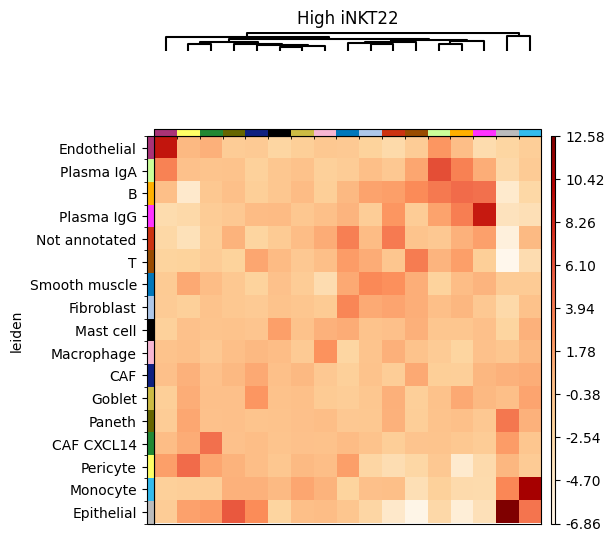

In [83]:
# plotted values are in adata_low.uns['leiden_nhood_enrichment']['zscore']

sq.pl.nhood_enrichment(
    adata_high,
    cluster_key="leiden",
    method="average", 
    cmap='OrRd',
    figsize=(5, 5),
    title = 'High iNKT22'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/neighborhood_high.pdf',bbox_inches="tight")

In [32]:
# for each fov, for each possible comparison between cell-types report the minkovski distance 
"""
distance_per_cell_type_low_all = {}

for fov in pd.unique(adata_low.obs.fov):
    adata_fov = adata_low[adata_low.obs.fov == fov]
    pos_fov = adata_fov.obs[['CenterX_global_px','CenterY_global_px']]
    dm_fov = distance_matrix(pos_fov, pos_fov)
    dm_fov = tril(dm_fov).toarray()
    distances_fov = pd.DataFrame(dm_fov, index = adata_fov.obs.leiden, columns = adata_fov.obs.leiden)

    for r in range(1,adata_fov.shape[0]):
        if r == 1:
            c= 0
            combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index.values[r]
            combination2 = distances_fov.index.values[r] + '-' + distances_fov.columns.values[c]
                
            if combination1 in distance_per_cell_type_low_all.keys() :
                distance_per_cell_type_low_all[combination1].append(distances_fov.iat[r,c])
            elif combination2 in distance_per_cell_type_low_all.keys():
                distance_per_cell_type_low_all[combination2].append(distances_fov.iat[r,c])
            else:
                distance_per_cell_type_low_all[combination1] = [distances_fov.iat[r,c]]
        
        else:
            for c in range(r):
                combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index.values[r]
                combination2 = distances_fov.index.values[r] + '-' + distances_fov.columns.values[c]
                
                if combination1 in distance_per_cell_type_low_all.keys() :
                    distance_per_cell_type_low_all[combination1].append(distances_fov.iat[r,c])
                elif combination2 in distance_per_cell_type_low_all.keys():
                    distance_per_cell_type_low_all[combination2].append(distances_fov.iat[r,c])
                else:
                    distance_per_cell_type_low_all[combination1] = [distances_fov.iat[r,c]]
"""

In [33]:
# for each fov, for each possible comparison between cell-types report the minkovski distance 
"""
distance_per_cell_type_high_all = {}

for fov in pd.unique(adata_high.obs.fov):
    adata_fov = adata_high[adata_high.obs.fov == fov]
    pos_fov = adata_fov.obs[['CenterX_global_px','CenterY_global_px']]
    dm_fov = distance_matrix(pos_fov, pos_fov)
    dm_fov = tril(dm_fov).toarray()
    distances_fov = pd.DataFrame(dm_fov, index = adata_fov.obs.leiden, columns = adata_fov.obs.leiden)

    for r in range(1,adata_fov.shape[0]):
        if r == 1:
            c= 0
            combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index[r]
            combination2 = distances_fov.index[r] + '-' + distances_fov.columns.values[c]
                
            if combination1 in distance_per_cell_type_high_all.keys() :
                distance_per_cell_type_high_all[combination1].append(distances_fov.iat[r,c])
            elif combination2 in distance_per_cell_type_high_all.keys():
                distance_per_cell_type_high_all[combination2].append(distances_fov.iat[r,c])
            else:
                distance_per_cell_type_high_all[combination1] = [distances_fov.iat[r,c]]
        
        else:
            for c in range(r):
                combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index[r]
                combination2 = distances_fov.index[r] + '-' + distances_fov.columns.values[c]
                
                if combination1 in distance_per_cell_type_high_all.keys() :
                    distance_per_cell_type_high_all[combination1].append(distances_fov.iat[r,c])
                elif combination2 in distance_per_cell_type_high_all.keys():
                    distance_per_cell_type_high_all[combination2].append(distances_fov.iat[r,c])
                else:
                    distance_per_cell_type_high_all[combination1] = [distances_fov.iat[r,c]]

"""

In [34]:
# compute the t-test between the distribution of distances between two cell types in high and in low.
# bonferroni correction
"""
from scipy import stats
from statsmodels.sandbox.stats.multicomp import multipletests

t_test_results = pd.DataFrame(columns=['comparison', 'statistic', 'pvalue'])
# loop over column_list and execute code explained above
for combination in distance_per_cell_type_high_all.keys():
    combination2 = combination.replace('-', ' ').split(' ')[1] + '-' + combination.replace('-', ' ').split(' ')[0]
    
    if combination in distance_per_cell_type_low_all.keys():
        low = distance_per_cell_type_low_all[combination]
        high = distance_per_cell_type_high_all[combination]
        new_row = [combination, stats.ttest_ind(low,high).statistic, stats.ttest_ind(low,high).pvalue]
        t_test_results.loc[len(t_test_results)]  = new_row
    elif combination2 in distance_per_cell_type_low_all.keys():
        low = distance_per_cell_type_low_all[combination2]
        high = distance_per_cell_type_high_all[combination]
        new_row = [combination, stats.ttest_ind(low,high).statistic, stats.ttest_ind(low,high).pvalue]
        t_test_results.loc[len(t_test_results)]  = new_row

rejected, p_adjusted, _, alpha_corrected = multipletests(t_test_results['pvalue'].values, alpha=0.05, 
                               method='bonferroni', is_sorted=False, returnsorted=False)

t_test_results['p_adjusted'] = p_adjusted

t_test_results.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/comparisons_distance_high_low.txt', index =False)
t_test_results
"""

,comparison,statistic,pvalue,p_adjusted
0,Pericyte-Pericyte,3.899336,9.658519e-05,6.084867e-03
1,Pericyte-CAF,-13.942503,4.053412e-44,2.553650e-42
2,CAF-Plasma IgG,-4.560603,5.104214e-06,3.215655e-04
3,Pericyte-Macrophage,-13.190802,1.125090e-39,7.088065e-38
4,CAF-Macrophage,-2.938060,3.302971e-03,2.080872e-01
...,...,...,...,...
58,Epithelial-Pericyte,11.274882,3.346029e-29,2.107998e-27
59,CAF CXCL14-Pericyte,7.815933,6.762087e-15,4.260115e-13
60,Epithelial-Fibroblast,-5.387545,8.869159e-08,5.587570e-06
61,CAF CXCL14-Fibroblast,4.253593,2.333823e-05,1.470308e-03


In [35]:
"""np.array(t_test_results['comparison'])"""

array(['Pericyte-Pericyte', 'Pericyte-CAF', 'CAF-Plasma IgG',
       'Pericyte-Macrophage', 'CAF-Macrophage', 'Macrophage-Macrophage',
       'Plasma IgG-Plasma IgG', 'Pericyte-B', 'CAF-B', 'Macrophage-B',
       'B-B', 'Pericyte-T', 'CAF-T', 'Macrophage-T', 'B-T', 'CAF-CAF',
       'T-T', 'CAF-Plasma IgA', 'Plasma IgG-Plasma IgA',
       'Macrophage-Plasma IgA', 'T-Plasma IgA', 'Pericyte-Smooth muscle',
       'CAF-Smooth muscle', 'Plasma IgG-Smooth muscle',
       'Macrophage-Smooth muscle', 'T-Smooth muscle',
       'Plasma IgA-Smooth muscle', 'Pericyte-Endothelial',
       'CAF-Endothelial', 'Macrophage-Endothelial', 'B-Endothelial',
       'T-Endothelial', 'Endothelial-Endothelial',
       'Plasma IgA-Plasma IgA', 'Pericyte-Fibroblast', 'CAF-Fibroblast',
       'Plasma IgG-Fibroblast', 'Macrophage-Fibroblast', 'B-Fibroblast',
       'T-Fibroblast', 'Plasma IgA-Fibroblast',
       'Smooth muscle-Fibroblast', 'Endothelial-Fibroblast',
       'Macrophage-Epithelial', 'CAF-Epithelial'

In [50]:
"""'Plasma IgG-T' in distance_per_cell_type_high_all.keys()"""

True

In [52]:
""""
pericyte = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-Pericyte'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['Pericyte-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-Pericyte'], distance_per_cell_type_high_all['Pericyte-T']])})
pericyte.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Pericyte.xlsx',
           index=None)

CAF = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['CAF-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['CAF-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['CAF-T'], distance_per_cell_type_high_all['CAF-T']])})
CAF.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/CAF.xlsx',
           index=None)

macrophage = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['Macrophage-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['Macrophage-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['Macrophage-T'], distance_per_cell_type_high_all['Macrophage-T']])})
macrophage.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Macrophage.xlsx',
           index=None)

B = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-B'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['B-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-B'], distance_per_cell_type_high_all['B-T']])})
B.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/B.xlsx',
           index=None)

T = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-T'], distance_per_cell_type_high_all['T-T']])})
T.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/T.xlsx',
           index=None)

plasmaIgA = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-Plasma IgA'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-Plasma IgA']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-Plasma IgA'], distance_per_cell_type_high_all['T-Plasma IgA']])})
plasmaIgA.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Plasma IgA.xlsx',
           index=None)

plasmaIgG = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-Plasma IgG'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['Plasma IgG-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-Plasma IgG'], distance_per_cell_type_high_all['Plasma IgG-T']])})
plasmaIgG.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Plasma IgG.xlsx',
           index=None)

smooth = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-Smooth muscle'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-Smooth muscle']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-Smooth muscle'], distance_per_cell_type_high_all['T-Smooth muscle']])})
smooth.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Smooth muscle cell.xlsx',
           index=None)

endothelial = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['Endothelial-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-Endothelial']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['Endothelial-T'], distance_per_cell_type_high_all['T-Endothelial']])})
endothelial.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Endothelial.xlsx',
           index=None)

fibro = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-Fibroblast'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-Fibroblast']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-Fibroblast'], distance_per_cell_type_high_all['T-Fibroblast']])})
fibro.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Fibroblast.xlsx',
           index=None)

epi = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['T-Epithelial'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-Epithelial']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['T-Epithelial'], distance_per_cell_type_high_all['T-Epithelial']])})
epi.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/Epithelial.xlsx',
           index=None)

CAF_CXCL14 = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_all['CAF CXCL14-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_all['T-CAF CXCL14']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_all['CAF CXCL14-T'], distance_per_cell_type_high_all['T-CAF CXCL14']])})
CAF_CXCL14.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_T/CAF CXCL14.xlsx',
           index=None) 
"""

In [53]:
# compute, for each pair of cell-types, the mean distance considering all the distances from all the fovs 
"""
distance_per_cell_type_low_mean = {}

for k in distance_per_cell_type_low_all.keys():
    distance_per_cell_type_low_mean[k] = np.mean(distance_per_cell_type_low_all[k])

distance_per_cell_type_low_mean_df = pd.DataFrame(columns = ['cell_type1', 'cell_type2', 'mean'])

for i in distance_per_cell_type_low_mean.items():
    new_row = [i[0].split('-')[0], i[0].split('-')[1], i[1]]
    distance_per_cell_type_low_mean_df.loc[len(distance_per_cell_type_low_mean_df)]  = new_row

distance_per_cell_type_low_mean_df
distance_per_cell_type_low_mean_df.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_low.txt', index =False)
"""

In [54]:
# compute, for each pair of cell-types, the mean distance considering all the distances from all the fovs 
"""
distance_per_cell_type_high_mean = {}

for k in distance_per_cell_type_high_all.keys():
    distance_per_cell_type_high_mean[k] = np.mean(distance_per_cell_type_high_all[k])

distance_per_cell_type_high_mean_df = pd.DataFrame(columns = ['cell_type1', 'cell_type2', 'mean'])

for i in distance_per_cell_type_high_mean.items():
    new_row = [i[0].split('-')[0], i[0].split('-')[1], i[1]]
    distance_per_cell_type_high_mean_df.loc[len(distance_per_cell_type_high_mean_df)]  = new_row

distance_per_cell_type_high_mean_df
distance_per_cell_type_high_mean_df.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_K/distances_high.txt', index =False)
"""

In [47]:
# for each fov, compute the mean distance between each pair of cell-types in that fov

distance_per_cell_type_low_fov_mean = {}

for fov in pd.unique(adata_low.obs.fov):
    adata_fov = adata_low[adata_low.obs.fov == fov]
    pos_fov = adata_fov.obs[['CenterX_global_px','CenterY_global_px']]
    dm_fov = distance_matrix(pos_fov, pos_fov)
    dm_fov = tril(dm_fov).toarray()
    distances_fov = pd.DataFrame(dm_fov, index = adata_fov.obs.leiden, columns = adata_fov.obs.leiden)
    distance_per_cell_type_low = {}
    
    for r in range(1,adata_fov.shape[0]):
        if r == 1:
            c= 0
            combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index[r]
            combination2 = distances_fov.index[r] + '-' + distances_fov.columns.values[c]
                
            if combination1 in distance_per_cell_type_low.keys() :
                distance_per_cell_type_low[combination1].append(distances_fov.iat[r,c])
            elif combination2 in distance_per_cell_type_low.keys():
                distance_per_cell_type_low[combination2].append(distances_fov.iat[r,c])
            else:
                distance_per_cell_type_low[combination1] = [distances_fov.iat[r,c]]
        
        else:
            for c in range(r):
                combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index[r]
                combination2 = distances_fov.index[r] + '-' + distances_fov.columns.values[c]
                
                if combination1 in distance_per_cell_type_low.keys() :
                    distance_per_cell_type_low[combination1].append(distances_fov.iat[r,c])
                elif combination2 in distance_per_cell_type_low.keys():
                    distance_per_cell_type_low[combination2].append(distances_fov.iat[r,c])
                else:
                    distance_per_cell_type_low[combination1] = [distances_fov.iat[r,c]]

    for combination in distance_per_cell_type_low.keys():
        combination2 = combination.split('-')[1] +'-'+combination.split('-')[0]
        if combination in distance_per_cell_type_low_fov_mean.keys():
            distance_per_cell_type_low_fov_mean[combination].append(np.mean(distance_per_cell_type_low[combination]))
        elif combination2 in distance_per_cell_type_low_fov_mean.keys():
            distance_per_cell_type_low_fov_mean[combination2].append(np.mean(distance_per_cell_type_low[combination]))
        else:
            distance_per_cell_type_low_fov_mean[combination] = [np.mean(distance_per_cell_type_low[combination])]


In [48]:
# compute, for each pair of cell-types, the mean distance betweeb the mean distances of the different fovs

distance_per_cell_type_high_fov_mean = {}

for fov in pd.unique(adata_high.obs.fov):
    adata_fov = adata_high[adata_high.obs.fov == fov]
    pos_fov = adata_fov.obs[['CenterX_global_px','CenterY_global_px']]
    dm_fov = distance_matrix(pos_fov, pos_fov)
    dm_fov = tril(dm_fov).toarray()
    distances_fov = pd.DataFrame(dm_fov, index = adata_fov.obs.leiden, columns = adata_fov.obs.leiden)
    distance_per_cell_type_high = {}
    
    for r in range(1,adata_fov.shape[0]):
        if r == 1:
            c= 0
            combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index[r]
            combination2 = distances_fov.index[r] + '-' + distances_fov.columns.values[c]
                
            if combination1 in distance_per_cell_type_high.keys() :
                distance_per_cell_type_high[combination1].append(distances_fov.iat[r,c])
            elif combination2 in distance_per_cell_type_high.keys():
                distance_per_cell_type_high[combination2].append(distances_fov.iat[r,c])
            else:
                distance_per_cell_type_high[combination1] = [distances_fov.iat[r,c]]
        
        else:
            for c in range(r):
                combination1 = distances_fov.columns.values[c] + '-' + distances_fov.index[r]
                combination2 = distances_fov.index[r] + '-' + distances_fov.columns.values[c]
                
                if combination1 in distance_per_cell_type_high.keys() :
                    distance_per_cell_type_high[combination1].append(distances_fov.iat[r,c])
                elif combination2 in distance_per_cell_type_high.keys():
                    distance_per_cell_type_high[combination2].append(distances_fov.iat[r,c])
                else:
                    distance_per_cell_type_high[combination1] = [distances_fov.iat[r,c]]

    for combination in distance_per_cell_type_high.keys():
        combination2 = combination.split('-')[1] +'-'+combination.split('-')[0]
        if combination in distance_per_cell_type_high_fov_mean.keys():
            distance_per_cell_type_high_fov_mean[combination].append(np.mean(distance_per_cell_type_high[combination]))
        elif combination2 in distance_per_cell_type_high_fov_mean.keys():
            distance_per_cell_type_high_fov_mean[combination2].append(np.mean(distance_per_cell_type_high[combination]))
        else:
            distance_per_cell_type_high_fov_mean[combination] = [np.mean(distance_per_cell_type_high[combination])]


In [49]:
# compute, for each pair of cell-types, the mean distance between the mean distances of the different fovs

distance_per_cell_type_low_fov_mean2 = {}

for k in distance_per_cell_type_low_fov_mean.keys():
    distance_per_cell_type_low_fov_mean2[k] = np.mean(distance_per_cell_type_low_fov_mean[k])

distance_per_cell_type_low_fov_mean2_df = pd.DataFrame(columns = ['cell_type1', 'cell_type2', 'mean'])

for i in distance_per_cell_type_low_fov_mean2.items():
    new_row = [i[0].split('-')[0], i[0].split('-')[1], i[1]]
    distance_per_cell_type_low_fov_mean2_df.loc[len(distance_per_cell_type_low_fov_mean2_df)]  = new_row

distance_per_cell_type_low_fov_mean2_df.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_low_mean.txt', index =False)

distance_per_cell_type_low_fov_mean2_df

,cell_type1,cell_type2,mean
0,Not annotated,Macrophage,2321.260230
1,Not annotated,T,2296.574468
2,Macrophage,T,2246.230769
3,Not annotated,Not annotated,2160.184728
4,Macrophage,Macrophage,2177.852122
...,...,...,...
147,Mast cell,Pericyte,2957.805310
148,Plasma IgA,CAF CXCL14,2320.534728
149,Mast cell,CAF CXCL14,1965.498892
150,Epithelial,Plasma IgA,2581.418119


In [50]:
# compute, for each pair of cell-types, the mean distance between the mean distances of the different fovs

distance_per_cell_type_high_fov_mean2 = {}

for k in distance_per_cell_type_high_fov_mean.keys():
    distance_per_cell_type_high_fov_mean2[k] = np.mean(distance_per_cell_type_high_fov_mean[k])

distance_per_cell_type_high_fov_mean2_df = pd.DataFrame(columns = ['cell_type1', 'cell_type2', 'mean'])

for i in distance_per_cell_type_high_fov_mean2.items():
    new_row = [i[0].split('-')[0], i[0].split('-')[1], i[1]]
    distance_per_cell_type_high_fov_mean2_df.loc[len(distance_per_cell_type_high_fov_mean2_df)]  = new_row

distance_per_cell_type_high_fov_mean2_df.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_high_mean.txt', index =False)

distance_per_cell_type_high_fov_mean2_df

,cell_type1,cell_type2,mean
0,Pericyte,Pericyte,2059.801080
1,Pericyte,CAF,2240.851758
2,Pericyte,Macrophage,2325.923209
3,CAF,Macrophage,2195.468712
4,Pericyte,T,2262.483129
...,...,...,...
148,Plasma IgA,Goblet,1904.761090
149,CAF CXCL14,Goblet,1491.498452
150,Paneth,Goblet,1424.893268
151,Smooth muscle,Goblet,2148.851027


In [51]:
# for each pair of cell-types, compute the wilcoxon test between the distribution of mean distances in the fovs of high and low conditions
# fdr correction

from scipy import stats
from statsmodels.sandbox.stats.multicomp import multipletests

t_test_results_mean = pd.DataFrame(columns=['comparison', 'statistic', 'pvalue'])
# loop over column_list and execute code explained above
for combination in distance_per_cell_type_high_fov_mean.keys():
    combination2 = combination.replace('-', ' ').split(' ')[1] + '-' + combination.replace('-', ' ').split(' ')[0]
    
    if combination in distance_per_cell_type_low_fov_mean.keys():
        low = distance_per_cell_type_low_fov_mean[combination]
        high = distance_per_cell_type_high_fov_mean[combination]
        new_row = [combination, stats.ttest_ind(low,high).statistic, stats.ttest_ind(low,high).pvalue]
        t_test_results_mean.loc[len(t_test_results_mean)]  = new_row
    elif combination2 in distance_per_cell_type_low_fov_mean.keys():
        low = distance_per_cell_type_low_fov_mean[combination2]
        high = distance_per_cell_type_high_fov_mean[combination]
        new_row = [combination, stats.ttest_ind(low,high).statistic, stats.ttest_ind(low,high).pvalue]
        t_test_results_mean.loc[len(t_test_results_mean)]  = new_row

t_test_results_mean= t_test_results_mean.dropna()

rejected, p_adjusted, _, alpha_corrected = multipletests(t_test_results_mean['pvalue'].values, alpha=0.05, 
                               method='fdr_bh', is_sorted=False, returnsorted=False)

t_test_results_mean['p_adjusted'] = p_adjusted

t_test_results_mean.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/comparisons_distance_high_low_mean.txt', index =False)
t_test_results_mean

,comparison,statistic,pvalue,p_adjusted
0,Pericyte-Pericyte,0.387213,0.704421,0.922163
1,Pericyte-CAF,-0.500304,0.624633,0.922163
2,Pericyte-Macrophage,0.353361,0.729082,0.922163
3,CAF-Macrophage,1.131861,0.275463,0.922163
4,Pericyte-T,0.282518,0.781680,0.926922
...,...,...,...,...
117,Fibroblast-Goblet,0.950826,0.373359,0.922163
118,Epithelial-Goblet,1.005657,0.360739,0.922163
119,CAF CXCL14-Goblet,2.229272,0.061036,0.555385
120,Paneth-Goblet,0.215760,0.837701,0.946291


In [52]:
np.array(t_test_results_mean['comparison'])

array(['Pericyte-Pericyte', 'Pericyte-CAF', 'Pericyte-Macrophage',
       'CAF-Macrophage', 'Pericyte-T', 'CAF-T', 'Macrophage-T',
       'Macrophage-Macrophage', 'T-T', 'Pericyte-Fibroblast',
       'CAF-Fibroblast', 'Macrophage-Fibroblast', 'T-Fibroblast',
       'Pericyte-B', 'CAF-B', 'Macrophage-B', 'T-B', 'Fibroblast-B',
       'CAF-CAF', 'Fibroblast-Fibroblast', 'Pericyte-Plasma IgG',
       'CAF-Plasma IgG', 'Macrophage-Plasma IgG', 'T-Plasma IgG',
       'Fibroblast-Plasma IgG', 'Not annotated-Plasma IgG', 'B-B',
       'Not annotated-Not annotated', 'Plasma IgG-Plasma IgG',
       'Pericyte-Smooth muscle', 'CAF-Smooth muscle',
       'Macrophage-Smooth muscle', 'T-Smooth muscle',
       'Fibroblast-Smooth muscle', 'B-Smooth muscle',
       'Not annotated-Smooth muscle', 'Plasma IgG-Smooth muscle',
       'CAF-Mast cell', 'Macrophage-Mast cell', 'T-Mast cell',
       'Fibroblast-Mast cell', 'B-Mast cell', 'Not annotated-Mast cell',
       'Plasma IgG-Mast cell', 'Smooth muscle-

In [102]:
'CAF-T' in distance_per_cell_type_low_fov_mean.keys()

False

In [99]:
'CAF-T' in distance_per_cell_type_high_fov_mean.keys()

True

In [103]:
pericyte = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Pericyte'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['Pericyte-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Pericyte'], distance_per_cell_type_high_fov_mean['Pericyte-T']])})
pericyte.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Pericyte.xlsx',
           index=None)

paneth = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Paneth'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Paneth']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Paneth'], distance_per_cell_type_high_fov_mean['T-Paneth']])})
paneth.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Paneth.xlsx',
           index=None)

monocyte = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Monocyte'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Monocyte']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Monocyte'], distance_per_cell_type_high_fov_mean['T-Monocyte']])})
monocyte.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Monocyte.xlsx',
           index=None)

mast = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Mast cell'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Mast cell']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Mast cell'], distance_per_cell_type_high_fov_mean['T-Mast cell']])})
mast.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Mast.xlsx',
           index=None)

goblet = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Goblet'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Goblet']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Goblet'], distance_per_cell_type_high_fov_mean['T-Goblet']])})
goblet.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Goblet.xlsx',
           index=None)


CAF = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-CAF'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['CAF-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-CAF'], distance_per_cell_type_high_fov_mean['CAF-T']])})
CAF.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/CAF.xlsx',
           index=None)

macrophage = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['Macrophage-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['Macrophage-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['Macrophage-T'], distance_per_cell_type_high_fov_mean['Macrophage-T']])})
macrophage.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Macrophage.xlsx',
           index=None)

B = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-B'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-B']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-B'], distance_per_cell_type_high_fov_mean['T-B']])})
B.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/B.xlsx',
           index=None)

T = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-T'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-T']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-T'], distance_per_cell_type_high_fov_mean['T-T']])})
T.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/T.xlsx',
           index=None)

plasmaIgA = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Plasma IgA'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Plasma IgA']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Plasma IgA'], distance_per_cell_type_high_fov_mean['T-Plasma IgA']])})
plasmaIgA.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Plasma IgA.xlsx',
           index=None)

plasmaIgG = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Plasma IgG'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Plasma IgG']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Plasma IgG'], distance_per_cell_type_high_fov_mean['T-Plasma IgG']])})
plasmaIgG.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Plasma IgG.xlsx',
           index=None)

smooth = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Smooth muscle'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Smooth muscle']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Smooth muscle'], distance_per_cell_type_high_fov_mean['T-Smooth muscle']])})
smooth.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Smooth muscle cell.xlsx',
           index=None)

endothelial = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Endothelial'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Endothelial']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Endothelial'], distance_per_cell_type_high_fov_mean['T-Endothelial']])})
endothelial.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Endothelial.xlsx',
           index=None)

fibro = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Fibroblast'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Fibroblast']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Fibroblast'], distance_per_cell_type_high_fov_mean['T-Fibroblast']])})
fibro.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Fibroblast.xlsx',
           index=None)

epi = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-Epithelial'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-Epithelial']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-Epithelial'], distance_per_cell_type_high_fov_mean['T-Epithelial']])})
epi.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/Epithelial.xlsx',
           index=None)

CAF_CXCL14 = pd.DataFrame(data = {'iNKT22 level' : np.concatenate([np.repeat('Low',len(distance_per_cell_type_low_fov_mean['T-CAF CXCL14'])),
                          np.repeat('High',len(distance_per_cell_type_high_fov_mean['T-CAF CXCL14']))]), 
                          'Distance' : np.concatenate([distance_per_cell_type_low_fov_mean['T-CAF CXCL14'], distance_per_cell_type_high_fov_mean['T-CAF CXCL14']])})
CAF_CXCL14.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/distances_T_mean/CAF CXCL14.xlsx',
           index=None) 

### Compute Ripley’s statistics

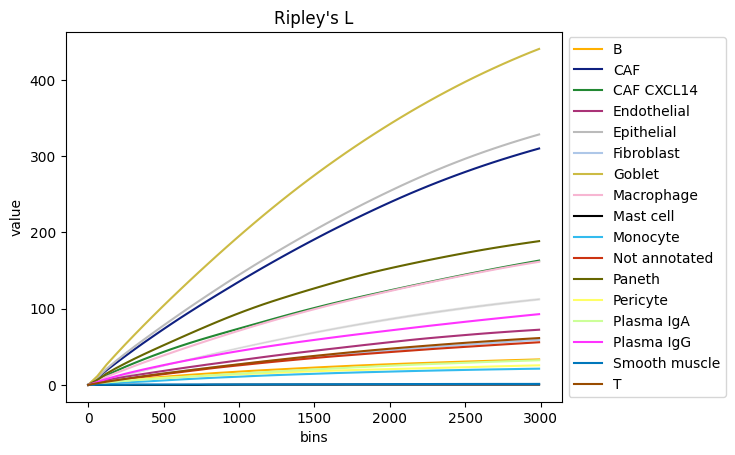

In [29]:
mode = "L"
sq.gr.ripley(adata_low, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_low,
    cluster_key="leiden",
    mode=mode,
    palette = mp.colors.ListedColormap(palette)
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/ripley_low.pdf',bbox_inches="tight")

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data


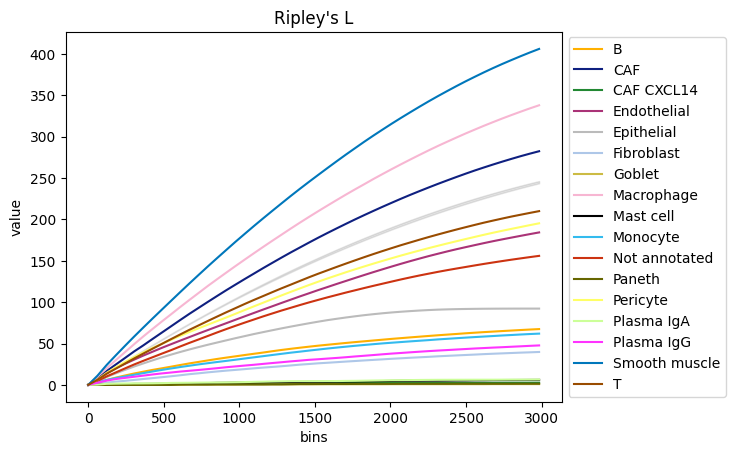

In [30]:
mode = "L"
sq.gr.ripley(adata_high, cluster_key="leiden", mode=mode)
sq.pl.ripley(
    adata_high,
    cluster_key="leiden",
    mode=mode,
    palette = mp.colors.ListedColormap(palette)
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/ripley_high.pdf',bbox_inches="tight")

In [29]:
ripley_per_fov_low = pd.DataFrame(index = pd.unique(adata_low.obs.fov), columns = pd.unique(adata_low.obs.leiden))

In [31]:
mode = "L"

for fov in pd.unique(adata_low.obs.fov):
    adata_fov = adata_low[adata_low.obs.fov == fov]
    sq.gr.ripley(adata_fov, cluster_key="leiden", mode=mode, max_dist = 500)

    a = adata_fov.uns['leiden_ripley_L']['L_stat']
    pvalues = []

    for inner_list in adata_fov.uns['leiden_ripley_L']['pvalues']:
        pvalues.extend(inner_list)

    a['p_value'] = pvalues

    sub_a = a[a.bins == 500]
    for c in pd.unique(adata_low.obs['leiden']):
        ripley_per_fov_low.loc[fov,c] = sub_a[sub_a.leiden==c]['stats'].values

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view

In [32]:
import openpyxl
ripley_per_fov_low.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/ripley_per_fov_low.xlsx')

In [33]:
ripley_per_fov_high = pd.DataFrame(index = pd.unique(adata_high.obs.fov), columns = pd.unique(adata_high.obs.leiden))

In [35]:
mode = "L"

for fov in pd.unique(adata_high.obs.fov):
    adata_fov = adata_high[adata_high.obs.fov == fov]
    sq.gr.ripley(adata_fov, cluster_key="leiden", mode=mode, max_dist = 500)

    a = adata_fov.uns['leiden_ripley_L']['L_stat']
    pvalues = []

    for inner_list in adata_fov.uns['leiden_ripley_L']['pvalues']:
        pvalues.extend(inner_list)

    a['p_value'] = pvalues

    sub_a = a[a.bins == 500]
    for c in pd.unique(adata_high.obs['leiden']):
        ripley_per_fov_high.loc[fov,c] = sub_a[sub_a.leiden==c]['stats'].values

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view

In [36]:
ripley_per_fov_high.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/ripley_per_fov_high.xlsx')

In [37]:
pd.unique(adata.obs.fov)

['1', '4', '5', '6', '7', ..., '16', '17', '18', '19', '20']
Length: 17
Categories (17, object): ['1', '10', '11', '12', ..., '6', '7', '8', '9']

### Compute centrality scores

In [31]:
degree_per_fov_high = pd.DataFrame(index = pd.unique(adata_high.obs.fov), columns = pd.unique(adata_high.obs.leiden))
average_per_fov_high = pd.DataFrame(index = pd.unique(adata_high.obs.fov), columns = pd.unique(adata_high.obs.leiden))
closeness_per_fov_high = pd.DataFrame(index = pd.unique(adata_high.obs.fov), columns = pd.unique(adata_high.obs.leiden))

In [32]:
degree_per_fov_high

,Pericyte,CAF,Macrophage,T,Fibroblast,B,Not annotated,Plasma IgG,Smooth muscle,Mast cell,CAF CXCL14,Endothelial,Monocyte,Paneth,Epithelial,Plasma IgA,Goblet
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
adata_fov.uns['leiden_centrality_scores']

,degree_centrality,average_clustering,closeness_centrality
B,0.266895,0.438926,0.407743
CAF,0.352941,0.418114,0.507353
CAF CXCL14,0.016509,0.339683,0.130421
Endothelial,0.253927,0.431069,0.387162
Fibroblast,0.162885,0.444948,0.354700
Macrophage,0.519161,0.429254,0.628080
Mast cell,0.024409,0.393333,0.151083
Monocyte,0.035461,0.301587,0.186262
Not annotated,0.404514,0.435856,0.497839
Paneth,0.003140,0.666667,0.079615


In [160]:
sq.gr.spatial_neighbors(
    adata2,
    radius=300,
    coord_type="generic",
)

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]


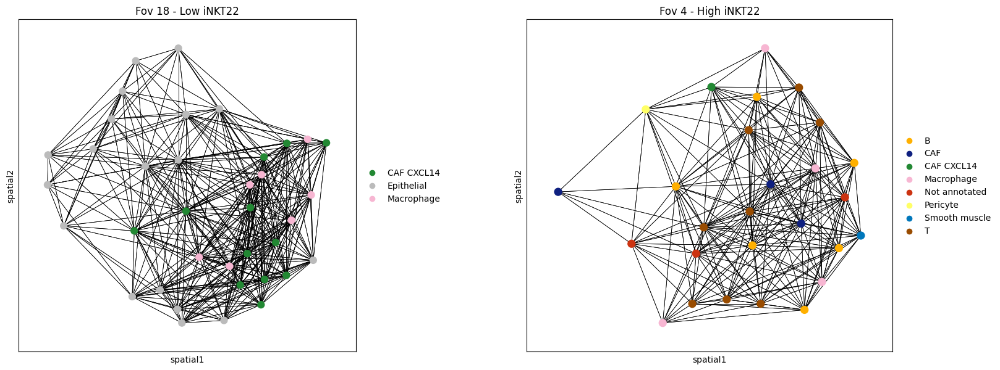

In [183]:
_, idx = adata2.obsp["spatial_connectivities"][100, :].nonzero()
#idx = np.append(idx, 420)

fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sq.pl.spatial_scatter(
    adata2[idx,:],
    library_key = 'fov',
    library_id=['18'],
    connectivity_key="spatial_connectivities",
    size=15,
    edges_width=0.5,
    edges_color="black",
    img=False,
    ax=ax[0],
    title = 'Fov 18 - Low iNKT22'
)

sq.pl.spatial_scatter(
    adata2[idx,:],
    library_key = 'fov',
    library_id=['4'],
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=15,
    edges_width=0.5,
    edges_color="black",
    img=False,
    ax=ax[1],
    title = 'Fov 4 - High iNKT22'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/grafh_fov18_4.pdf',bbox_inches="tight")


/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]


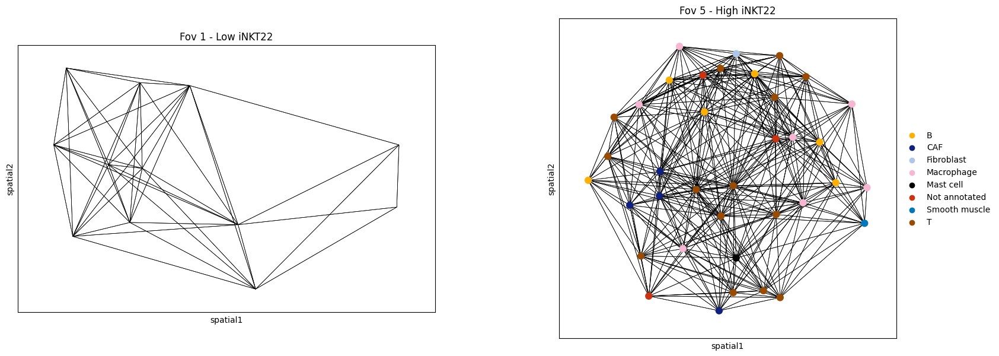

In [184]:
_, idx = adata2.obsp["spatial_connectivities"][100, :].nonzero()
#idx = np.append(idx, 420)

fig, ax = plt.subplots(1, 2, figsize=(20, 7))
sq.pl.spatial_scatter(
    adata2[idx,:],
    library_key = 'fov',
    library_id=['1'],
    connectivity_key="spatial_connectivities",
    size=15,
    edges_width=0.5,
    edges_color="black",
    img=False,
    ax=ax[0],
    title = 'Fov 1 - Low iNKT22'
)

sq.pl.spatial_scatter(
    adata2[idx,:],
    library_key = 'fov',
    library_id=['5'],
    color="leiden",
    connectivity_key="spatial_connectivities",
    size=15,
    edges_width=0.5,
    edges_color="black",
    img=False,
    ax=ax[1],
    title = 'Fov 5 - High iNKT22'
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/grafh_fov1_5.pdf',bbox_inches="tight")


In [46]:
for fov in pd.unique(adata_high.obs.fov):
    adata_fov = adata_high[adata_high.obs.fov == fov]
    adata_spatial_neighbor = sq.gr.spatial_neighbors(
        adata_fov, coord_type="generic", delaunay=True)

    sq.gr.centrality_scores(adata_fov, cluster_key="leiden")

    a = adata_fov.uns['leiden_centrality_scores']
    
    for c in a.index.values:
        degree_per_fov_high.loc[fov,c] = a.loc[c]['degree_centrality']

    for c in a.index.values:
        average_per_fov_high.loc[fov,c] = a.loc[c]['average_clustering']

    for c in a.index.values:
        closeness_per_fov_high.loc[fov,c] = a.loc[c]['closeness_centrality']


/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: S

In [47]:
degree_per_fov_low = pd.DataFrame(index = pd.unique(adata_low.obs.fov), columns = pd.unique(adata_low.obs.leiden))
average_per_fov_low = pd.DataFrame(index = pd.unique(adata_low.obs.fov), columns = pd.unique(adata_low.obs.leiden))
closeness_per_fov_low = pd.DataFrame(index = pd.unique(adata_low.obs.fov), columns = pd.unique(adata_low.obs.leiden))

In [48]:
for fov in pd.unique(adata_low.obs.fov):
    adata_fov = adata_low[adata_low.obs.fov == fov]
    adata_spatial_neighbor = sq.gr.spatial_neighbors(
        adata_fov, coord_type="generic", delaunay=True)

    sq.gr.centrality_scores(adata_fov, cluster_key="leiden")

    a = adata_fov.uns['leiden_centrality_scores']
    
    for c in a.index.values:
        degree_per_fov_low.loc[fov,c] = a.loc[c]['degree_centrality']

    for c in a.index.values:
        average_per_fov_low.loc[fov,c] = a.loc[c]['average_clustering']

    for c in a.index.values:
        closeness_per_fov_low.loc[fov,c] = a.loc[c]['closeness_centrality']

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: S

In [49]:
degree_per_fov_high.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/degree_per_fov_high.xlsx')
average_per_fov_high.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/average_per_fov_high.xlsx')
closeness_per_fov_high.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/closeness_per_fov_high.xlsx')

In [50]:
degree_per_fov_low.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/degree_per_fov_low.xlsx')
average_per_fov_low.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/average_per_fov_low.xlsx')
closeness_per_fov_low.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/closeness_per_fov_low.xlsx')

### Compute co-occurrence probability

In [27]:
co_occurrence_per_fov_low = pd.DataFrame(index = pd.unique(adata_low.obs.fov), columns = pd.unique(adata_low.obs.leiden))
co_occurrence_per_fov_high = pd.DataFrame(index = pd.unique(adata_high.obs.fov), columns = pd.unique(adata_high.obs.leiden))

In [39]:
adata_subset = adata2[adata2.obs.fov == "20"].copy()

  0%|          | 0/1 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


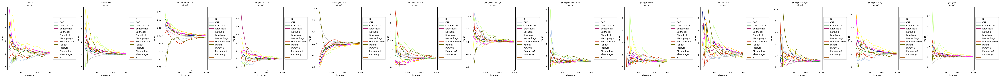

In [40]:
sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden"
)

sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden"
)
plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/co_occ_ratio_fov20_low.pdf',bbox_inches="tight")

In [41]:
adata_subset = adata2[adata2.obs.fov == "5"].copy()

  0%|          | 0/1 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


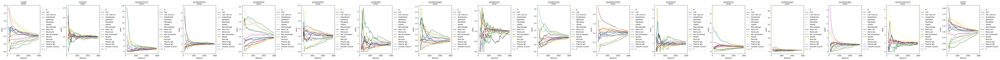

In [42]:
sq.gr.co_occurrence(
    adata_subset,
    cluster_key="leiden"
)

sq.pl.co_occurrence(
    adata_subset,
    cluster_key="leiden"
)
plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/co_occ_ratio_fov5_high.pdf',bbox_inches="tight")

### Neighboorhod enrichment analysis 

In [45]:
for fov in pd.unique(adata2.obs.fov):
    adata_fov = adata2[adata2.obs.fov == fov]
    sq.gr.spatial_neighbors(
    adata_fov,
    n_neighs=10,
    coord_type="generic")

    sq.gr.nhood_enrichment(adata_fov, cluster_key="leiden", seed=10)

    pd.DataFrame(adata_fov.uns['leiden_nhood_enrichment']['zscore'],
             index = np.sort(pd.unique(adata_fov.obs.leiden)), columns = np.sort(pd.unique(adata_fov.obs.leiden))).to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/neighboorhod/neighboorhod_'+str(fov)+'.xlsx')

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_nhood.py:202: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/squidpy/gr/_utils.py:194: ImplicitModificationWarning: Setting element `.obsp['spatial_connectivities']` of view, initializing view as actual.
  obj[key] = data


  0%|          | 0/1000 [00:00<?, ?/s]

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


### Novae
First, we need to load a pretrained Novae model.

Since we have a human colon slide, we load the "MICS-Lab/novae-human-0" model. Other model names can be found here (spot-resolution models, e.g. for Visium data, will come soon).

In [25]:
import novae

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/torch_geometric/typing.py:86: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/torch_scatter/_version_cpu.so, 0x0006): Symbol not found: __ZN3c1017RegisterOperatorsD1Ev
  Referenced from: <D18F459C-0B72-3445-A171-323DA250B6F5> /opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/torch_scatter/_version_cpu.so
  Expected in:     <36F46DB8-DB62-3926-8653-E332C34252FB> /opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/torch_geometric/typing.py:124: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/torch_sparse/_version_cpu.so, 0x0006

In [26]:
model = novae.Novae.from_pretrained("MICS-Lab/novae-human-0")
model

Novae model
   ├── Known genes: 60697
   ├── Parameters: 32.0M
   └── Model name: MICS-Lab/novae-human-0

Create a Delaunay graph from the spatial coordinates of the cells (in microns). The graph is stored in adata.obsp['spatial_connectivities'] and adata.obsp['spatial_distances']. The long edges are removed from the graph according to the radius argument (if provided). The spatial coordinates are expected to be in microns, and stored in adata.obsm["spatial"]. If the coordinates are in pixels, set pixel_size to the size of a pixel in microns. If you don't know the pixel_size, or if you don't have adata.obsm["spatial"], you can also provide the technology argument.

In [27]:
# this step because the spatial coordinates are not in micron but in pixel
novae.utils.spatial_neighbors(adata2, slide_key='fov',technology='cosmx')

[INFO] (novae.utils._build) Computing delaunay graph on 26,757 cells (radius threshold: [0.0, 100.0] microns)


Now, we can compute the spatial representations for each cell. In the first option below, we pass the argument zero_shot=True to run only inference (i.e., the model is not re-trained).

Instead of zero-shot, if you want to fine-tune the model, you can use the fine_tune method, and then call compute_representations without the zero_shot argument (see "option 2").

In [28]:
# Option 1: zero-shot
model.compute_representations(adata2, zero_shot=True)

# Option 2: fine-tuning
#model.fine_tune(adata)
#model.compute_representations(adata)

Computing representations:   0%|          | 0/53 [00:00<?, ?it/s]

To assign domains, you can use the assign_domains method, as below. By default, it creates 7 domains, but you can choose the number of domains you want with the level argument.

The function will save the domains in adata.obs, and return the name of the column in which it was saved

In [29]:
model.assign_domains(adata2, level=15)

'novae_domains_15'

Then, to show the results, you can use novae.plot.domains. If you run model.assign_domains multiple times, you can also decide the resolution you want to show, by passing the obs_key argument to novae.plot.domains.

[INFO] (novae.utils._validate) Using obs_key='novae_domains_20' as default.


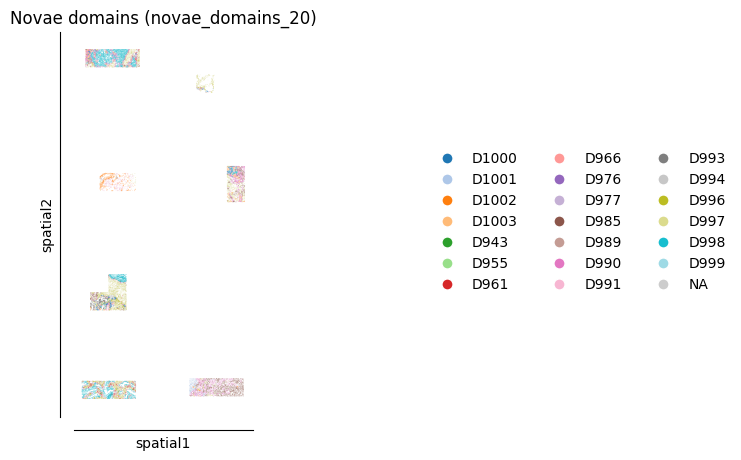

In [111]:
novae.plot.domains(adata2, library_id=None)

In [30]:
palette = ['#0F2080', '#006600', '#AA3377', '#BBBBBB', '#AEC7E8', '#CCBB44', '#F7B6D2','#000000',
          '#0077BB', '#EE7733', '#33BBEE', '#CC3311', '#7F7F7F', '#FFB000','#601A4A','#785EF0','#66CC00', '#CCFF99', 
          '#660000', '#E5CCFF','#FFFFCC','#CCFFE5']

sns.color_palette(palette)

[(0.058823529411764705, 0.12549019607843137, 0.5019607843137255),
 (0.0, 0.4, 0.0),
 (0.6666666666666666, 0.2, 0.4666666666666667),
 (0.7333333333333333, 0.7333333333333333, 0.7333333333333333),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (0.8, 0.7333333333333333, 0.26666666666666666),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.0, 0.0, 0.0),
 (0.0, 0.4666666666666667, 0.7333333333333333),
 (0.9333333333333333, 0.4666666666666667, 0.2),
 (0.2, 0.7333333333333333, 0.9333333333333333),
 (0.8, 0.2, 0.06666666666666667),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (1.0, 0.6901960784313725, 0.0),
 (0.3764705882352941, 0.10196078431372549, 0.2901960784313726),
 (0.47058823529411764, 0.3686274509803922, 0.9411764705882353),
 (0.4, 0.8, 0.0),
 (0.8, 1.0, 0.6),
 (0.4, 0.0, 0.0),
 (0.8980392156862745, 0.8, 1.0),
 (1.0, 1.0, 0.8),
 (0.8, 1.0, 0.8980392156862745)]

<Axes: title={'center': 'novae_domains_15'}, xlabel='UMAP1', ylabel='UMAP2'>

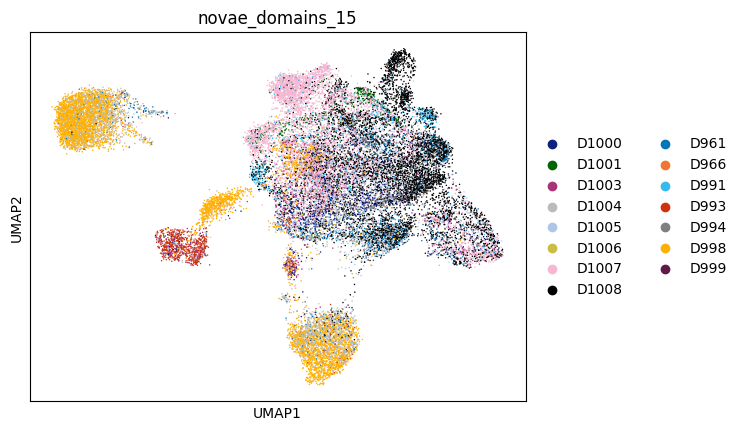

In [122]:
sc.pl.umap(
    adata2, show=False,
    color= "novae_domains_15",
    palette=sns.color_palette(palette)
)

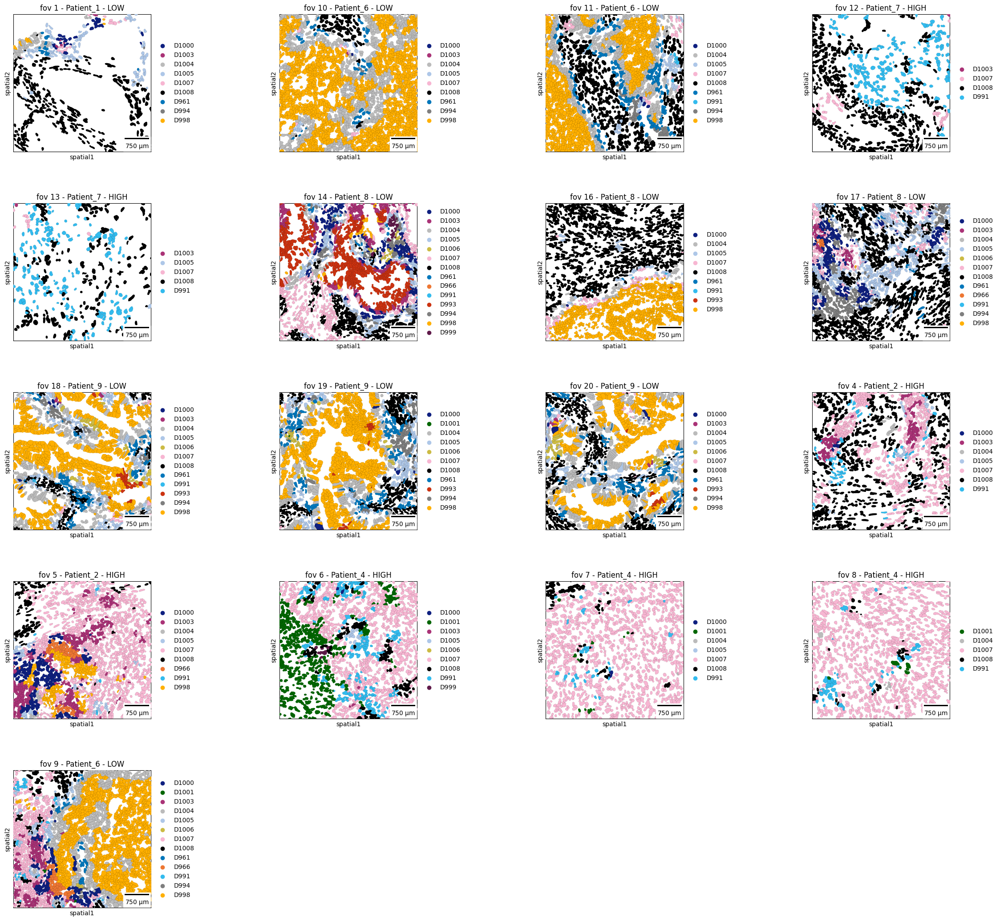

In [133]:
t = ['fov 1 - Patient_1 - LOW',
     'fov 10 - Patient_6 - LOW',
     'fov 11 - Patient_6 - LOW',
     'fov 12 - Patient_7 - HIGH',
     'fov 13 - Patient_7 - HIGH',
    'fov 14 - Patient_8 - LOW',
     'fov 16 - Patient_8 - LOW',
     'fov 17 - Patient_8 - LOW',
     'fov 18 - Patient_9 - LOW',
     'fov 19 - Patient_9 - LOW',
     'fov 20 - Patient_9 - LOW',
     'fov 4 - Patient_2 - HIGH',
     'fov 5 - Patient_2 - HIGH',
     'fov 6 - Patient_4 - HIGH',
     'fov 7 - Patient_4 - HIGH',
     'fov 8 - Patient_4 - HIGH',
    'fov 9 - Patient_6 - LOW']

sq.pl.spatial_segment(
    adata=adata2,
    color='novae_domains_15',
    library_key="fov",
    seg_cell_id="cell_ID",
    seg_outline=True,
    img=False,
    scalebar_dx=1.0,
    title= t,
    scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"},
)

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/niche_all_fov_novae_15domains.pdf',bbox_inches="tight")

In [31]:
adata2.obs.to_csv('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/metadata_adata_niche_novae_15domains.csv')

In [32]:
# Import JSON module
import json

f = open("/Users/paolamaragno/Downloads/h.all.v2024.1.Hs.json") 

data = json.load(f) 

In [33]:
data = {key: data[key] for key in ['HALLMARK_TNFA_SIGNALING_VIA_NFKB','HALLMARK_WNT_BETA_CATENIN_SIGNALING','HALLMARK_TGF_BETA_SIGNALING','HALLMARK_IL6_JAK_STAT3_SIGNALING',
'HALLMARK_DNA_REPAIR','HALLMARK_G2M_CHECKPOINT','HALLMARK_APOPTOSIS','HALLMARK_NOTCH_SIGNALING','HALLMARK_MYOGENESIS','HALLMARK_PROTEIN_SECRETION',
'HALLMARK_INTERFERON_ALPHA_RESPONSE','HALLMARK_INTERFERON_GAMMA_RESPONSE','HALLMARK_APICAL_JUNCTION','HALLMARK_APICAL_SURFACE','HALLMARK_HEDGEHOG_SIGNALING',
'HALLMARK_COMPLEMENT','HALLMARK_UNFOLDED_PROTEIN_RESPONSE','HALLMARK_PI3K_AKT_MTOR_SIGNALING','HALLMARK_E2F_TARGETS','HALLMARK_MYC_TARGETS_V1',
'HALLMARK_MYC_TARGETS_V2','HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION','HALLMARK_INFLAMMATORY_RESPONSE','HALLMARK_XENOBIOTIC_METABOLISM',
'HALLMARK_OXIDATIVE_PHOSPHORYLATION','HALLMARK_GLYCOLYSIS','HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY','HALLMARK_P53_PATHWAY','HALLMARK_ANGIOGENESIS',
'HALLMARK_HEME_METABOLISM','HALLMARK_COAGULATION','HALLMARK_IL2_STAT5_SIGNALING','HALLMARK_PEROXISOME','HALLMARK_KRAS_SIGNALING_UP',
'HALLMARK_KRAS_SIGNALING_DN','HALLMARK_MTORC1_SIGNALING']}

In [34]:
pathways = {}

for k in data.keys():
    pathways[k] = data[k]['geneSymbols']

/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/novae/plot/_heatmap.py:111: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby(obs_key).mean()


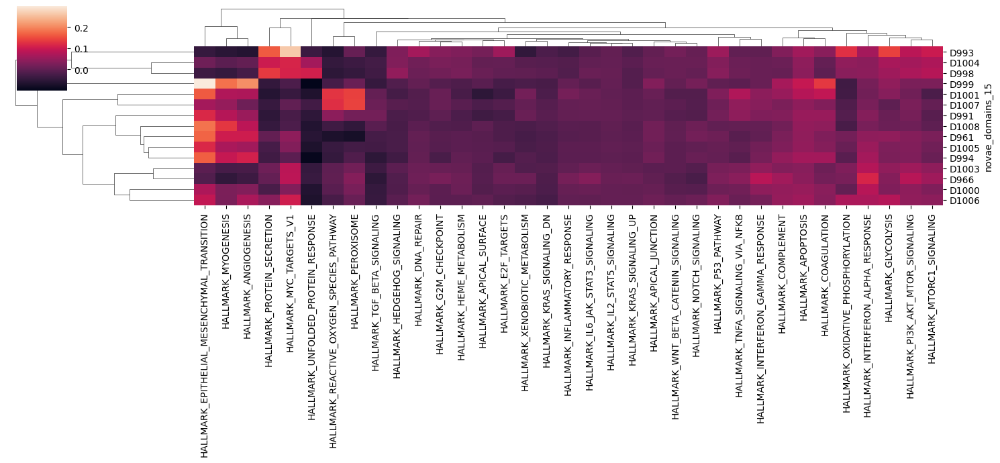

In [35]:
novae.plot.pathway_scores(adata2, obs_key ="novae_domains_15",pathways=pathways, figsize=(15, 7))

plt.savefig('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/pathways_novae_15domains.pdf',bbox_inches="tight")

### DEGs between niches

In [69]:
adata_niche_D1004 = adata2[adata2.obs.novae_domains_15 =='D1004']
adata_niche_D1005 = adata2[adata2.obs.novae_domains_15 =='D1005']
adata_niche_D1007 = adata2[adata2.obs.novae_domains_15 =='D1007']
adata_niche_D961 = adata2[adata2.obs.novae_domains_15 =='D961']
adata_niche_D991 = adata2[adata2.obs.novae_domains_15 =='D991']
adata_niche_D994 = adata2[adata2.obs.novae_domains_15 =='D994']
adata_niche_D998 = adata2[adata2.obs.novae_domains_15 =='D998']

In [70]:
sc.tl.rank_genes_groups(adata_niche_D1004, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
adata_niche_D1004 = sc.get.rank_genes_groups_df(adata_niche_D1004, group='LOW',key = "rank_genes_groups")
adata_niche_D1004.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D1004.xlsx')

sc.tl.rank_genes_groups(adata_niche_D1005, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
adata_niche_D1005 = sc.get.rank_genes_groups_df(adata_niche_D1005, group='LOW',key = "rank_genes_groups")
adata_niche_D1005.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D1005.xlsx')

sc.tl.rank_genes_groups(adata_niche_D1007, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
adata_niche_D1007 = sc.get.rank_genes_groups_df(adata_niche_D1007, group='LOW',key = "rank_genes_groups")
adata_niche_D1007.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D1007.xlsx')

#sc.tl.rank_genes_groups(adata_niche_D961, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
#adata_niche_D961 = sc.get.rank_genes_groups_df(adata_niche_D961, group='LOW',key = "rank_genes_groups")
#adata_niche_D961.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D961.xlsx')

sc.tl.rank_genes_groups(adata_niche_D991, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
adata_niche_D991 = sc.get.rank_genes_groups_df(adata_niche_D991, group='LOW',key = "rank_genes_groups")
adata_niche_D991.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D991.xlsx')

#sc.tl.rank_genes_groups(adata_niche_D994, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
#adata_niche_D994 = sc.get.rank_genes_groups_df(adata_niche_D994, group='LOW',key = "rank_genes_groups")
#adata_niche_D994.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D994.xlsx')

sc.tl.rank_genes_groups(adata_niche_D998, 'level', groups=['LOW'], reference='HIGH', method='wilcoxon')
adata_niche_D998 = sc.get.rank_genes_groups_df(adata_niche_D998, group='LOW',key = "rank_genes_groups")
adata_niche_D998.to_excel('/Users/paolamaragno/Library/CloudStorage/OneDrive-UniversitàdegliStudidiMilano/Policlinico/analisi/spatial/spatial/K/results_seed/DEGs_niche_D998.xlsx')


/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/anaconda3/envs/spatial_new/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing 

In [65]:
adata_niche_D1004_exp = pd.DataFrame(adata_niche_D1004.X.toarray(), index = adata_niche_D1004.obs.index.values, columns = adata_niche_D1004.var.index.values)
adata_niche_D1004_exp['level'] = adata_niche_D1004.obs.level

In [66]:
adata_niche_D1004_exp

,RAMP2,CD83,RYK,CD5L,NLRP2,BIRC5,LIF,H2AZ1,PTGES3,CDH11,...,PXDN,RGS13,SLA,SLCO2B1,SQLE,SRSF2,TGFBI,TPI1,ZBTB16,level
1_1,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,LOW
4_1,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,LOW
5_1,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.756014,1.181587,0.0,LOW
20_1,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.457673,0.457673,0.0,...,0.0,0.0,0.0,0.0,0.0,1.008387,0.000000,0.770471,0.0,LOW
23_1,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.321008,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.321008,0.000000,0.0,LOW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1688_20,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,LOW
1692_20,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,LOW
1693_20,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,1.808854,0.000000,0.0,LOW
1694_20,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,1.422852,0.000000,0.0,LOW


In [68]:
adata_niche_D1004_exp.groupby('level', as_index=False)['IL6'].mean()

/var/folders/xx/sgggrhp55xx_8s1thvzkgr600000gn/T/ipykernel_1674/3999256133.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_niche_D1004_exp.groupby('level', as_index=False)['IL6'].mean()


,level,IL6
0,HIGH,0.254628
1,LOW,0.033637
